In [3]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
#ignore harmless warnings
import warnings 
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_excel(r"C:\Users\SHIVA KUMAR\Documents\Life_turn\Data_Science\AI_Project- 2(Clusters)\World_development_mesurement (1) (1).xlsx")
data.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [6]:
data.shape

(2704, 25)

In [7]:
data.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [8]:
data.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions', 'Country',
       'Days to Start Business', 'Ease of Business', 'Energy Usage', 'GDP',
       'Health Exp % GDP', 'Health Exp/Capita', 'Hours to do Tax',
       'Infant Mortality Rate', 'Internet Usage', 'Lending Interest',
       'Life Expectancy Female', 'Life Expectancy Male', 'Mobile Phone Usage',
       'Number of Records', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Total', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [9]:
duplicate_rows = data[data.duplicated()]
duplicate_count = duplicate_rows.shape[0]  # Count the number of rows in the duplicated subset
print("Number of duplicated rows:", duplicate_count)


Number of duplicated rows: 0


In [10]:
data[data.duplicated()].values

array([], shape=(0, 25), dtype=object)

In [11]:
data.isna().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [12]:
import pandas as pd

# Assuming your DataFrame is named 'df'
object_columns = data.select_dtypes(include=['object']).columns
print("Object columns:", object_columns)


Object columns: Index(['Business Tax Rate', 'Country', 'GDP', 'Health Exp/Capita',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')


In [13]:
import pandas as pd

# Define your DataFrame 'data'

# Remove $ and convert to numeric
columns_to_clean = ['GDP', 'Health Exp/Capita', 'Tourism Inbound', 'Tourism Outbound']
for column in columns_to_clean:
    data[column] = pd.to_numeric(data[column].str.replace('[$,]', '', regex=True), errors='coerce')

# Remove % and convert to numeric
data['Business Tax Rate'] = pd.to_numeric(data['Business Tax Rate'].str.replace('%', '', regex=True), errors='coerce')


In [14]:
import pandas as pd

# Assuming your DataFrame is named 'df'
object_columns = data.select_dtypes(include=['object']).columns
print("Object columns:", object_columns)


Object columns: Index(['Country'], dtype='object')


In [15]:
unique_values = {column: data[column].unique() for column in data.columns}
unique_values

{'Birth Rate': array([0.02 , 0.05 , 0.043, 0.027, 0.046, 0.042, 0.041, 0.039, 0.051,
        0.048, 0.038, 0.03 , 0.025, 0.04 , 0.044, 0.034, 0.045, 0.035,
        0.031, 0.022, 0.017, 0.032, 0.053, 0.036, 0.019, 0.049, 0.024,
        0.033, 0.013, 0.015, 0.028, 0.023, 0.014, 0.012, 0.008, 0.026,
        0.009, 0.018, 0.021, 0.011, 0.01 ,   nan, 0.029, 0.016, 0.037,
        0.047, 0.007, 0.052]),
 'Business Tax Rate': array([  nan,  76.9,  52.1,  75.7,  17.1,  47.5, 279.7,  50.6,  65.7,
         74. , 217.9, 286.5,  64.9,  47.3,  37.8,  54.3,  44.1,  84.5,
         30.3,  45.1, 286. ,  39.8,  80.7,  54.2,  49.8,  28.8,  46.9,
         33.4,  51.4,  94.7,  26.2,  51.7,  37.5,  25.8,  42.3,  31.6,
         46.8,  50.3,  48.4, 272. ,  37.6,  49.7,  36.3,  43.8,  52.5,
         60.6,  36.9,  15.4,  32.3,  36.6,  46.4,  35.3,  40.8,  21.5,
         80. ,  57. ,  24.1,  66.6,  35.4,  68.1,  35.2,  36. ,   9.3,
         32.5,  43.1,  47.2,  27.7,  56.7,  79.9,  96.7,  39.9,  58.2,
        137

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   float64
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   float64
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [17]:
data.describe()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
count,2585.000000,1423.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2.494000e+03,2395.000000,2395.000000,1416.000000,...,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000,2.336000e+03,2.233000e+03
mean,0.022715,48.966901,1.423071e+05,39.999418,94.875676,7.723684e+04,2.638540e+11,0.064170,801.397077,302.068503,...,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953,4.939320e+09,4.729435e+09
std,0.011338,40.954116,6.159288e+05,57.318588,54.791906,2.599239e+05,1.129910e+12,0.026325,1473.448036,273.299686,...,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897,1.385098e+10,1.326774e+10
min,0.007000,8.200000,7.000000e+00,1.000000,1.000000,8.000000e+00,6.310127e+07,0.008000,2.000000,12.000000,...,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000,7.000000e+05,2.000000e+05
25%,0.013000,32.400000,1.360000e+03,13.000000,48.000000,3.737000e+03,3.539042e+09,0.046000,50.000000,156.000000,...,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000,1.250000e+08,1.100000e+08
50%,0.020000,41.000000,8.529000e+03,26.000000,94.000000,1.433800e+04,1.507975e+10,0.061000,193.000000,239.000000,...,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000,6.885000e+08,4.560000e+08
75%,0.031000,51.550000,5.910800e+04,45.000000,142.000000,4.185200e+04,1.102047e+11,0.079000,665.000000,344.750000,...,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000,3.601500e+09,2.842000e+09
max,0.053000,339.100000,8.286892e+06,694.000000,189.000000,2.727728e+06,1.624460e+13,0.225000,9908.000000,2600.000000,...,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000,2.000920e+11,1.265730e+11


In [18]:
#Renameing the features
data.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)
data.columns

Index(['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions', 'Country',
       'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
       'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
       'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
       'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
       'Number_of_Records', 'Population_0-14', 'Population_15-64',
       'Population_65+', 'Population_Total', 'Population_Urban',
       'Tourism_Inbound', 'Tourism_Outbound'],
      dtype='object')

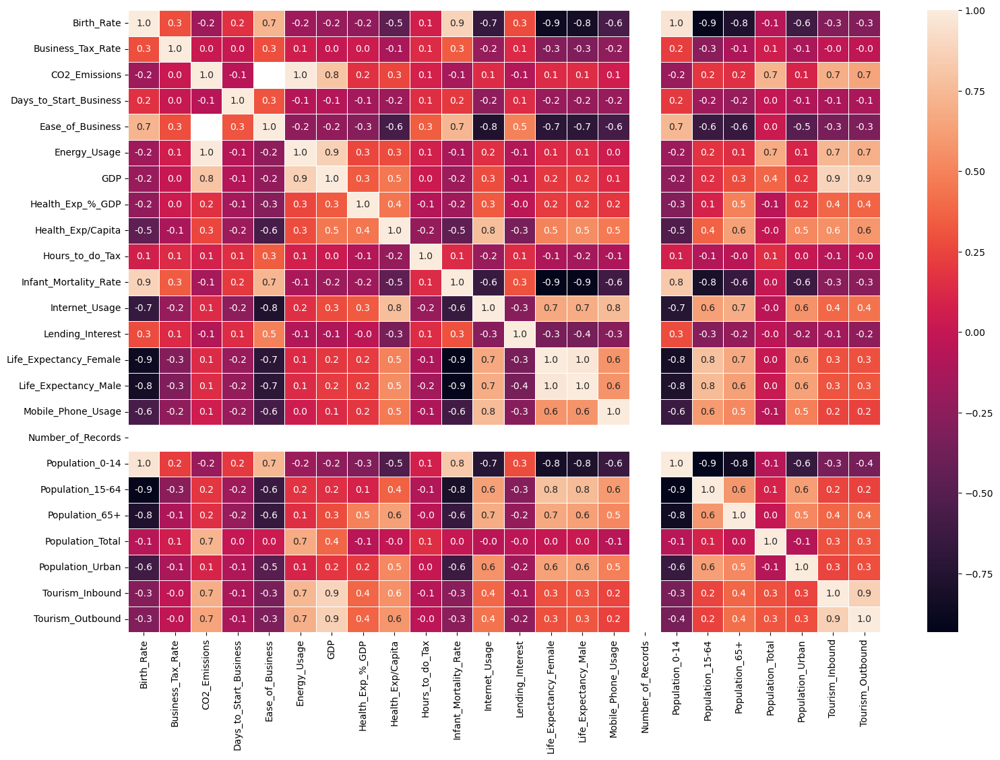

In [19]:
#Heatmap(test)
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

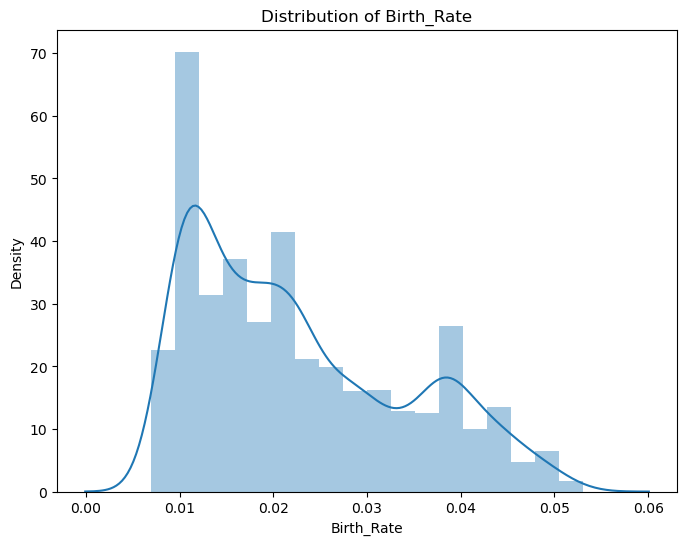

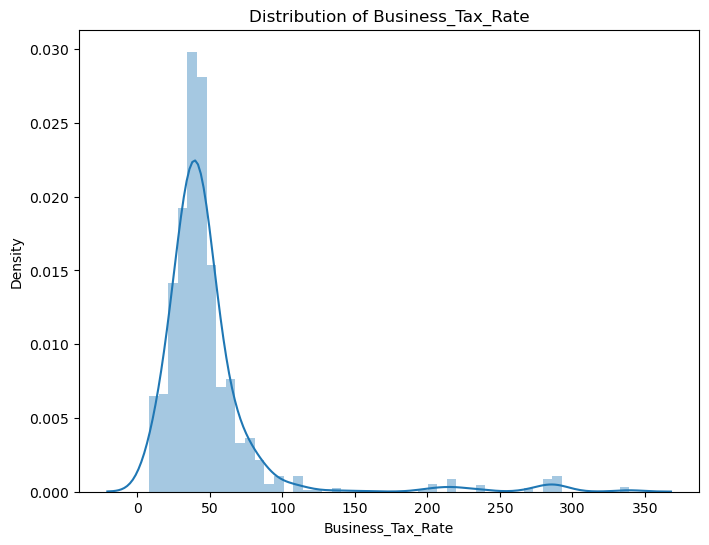

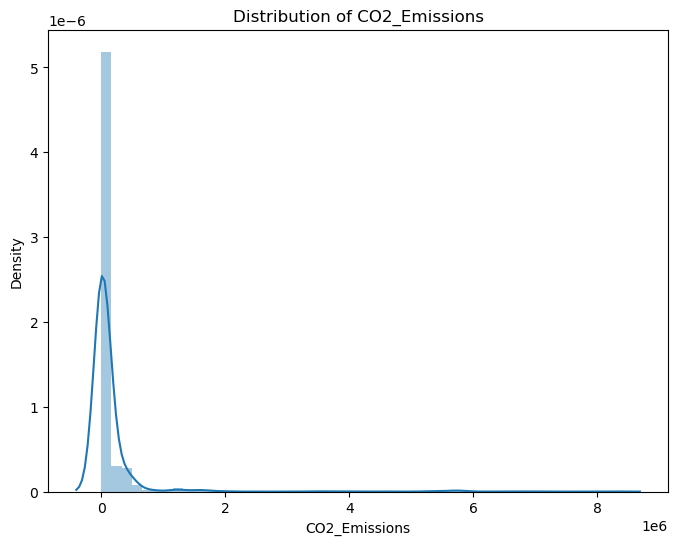

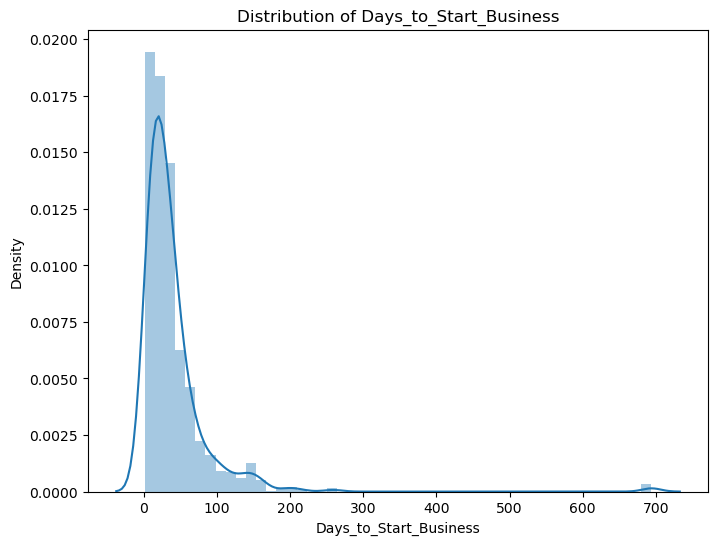

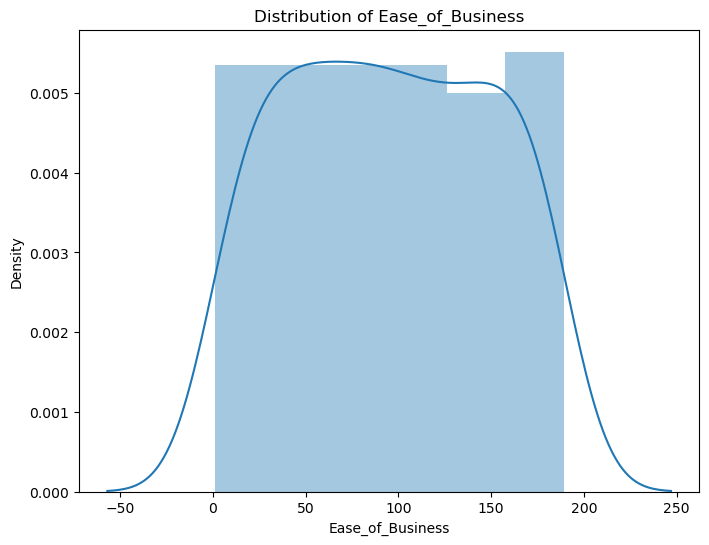

...

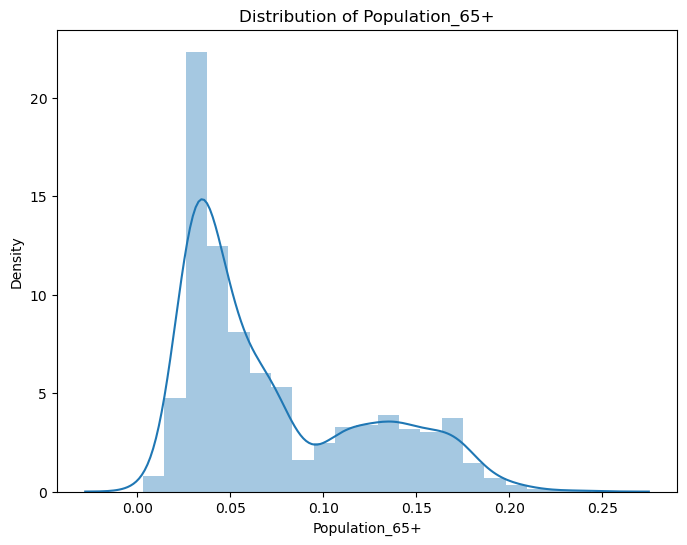

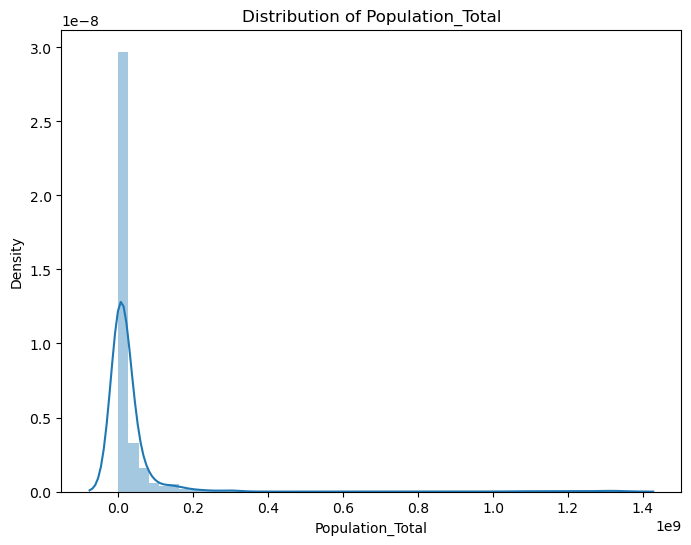

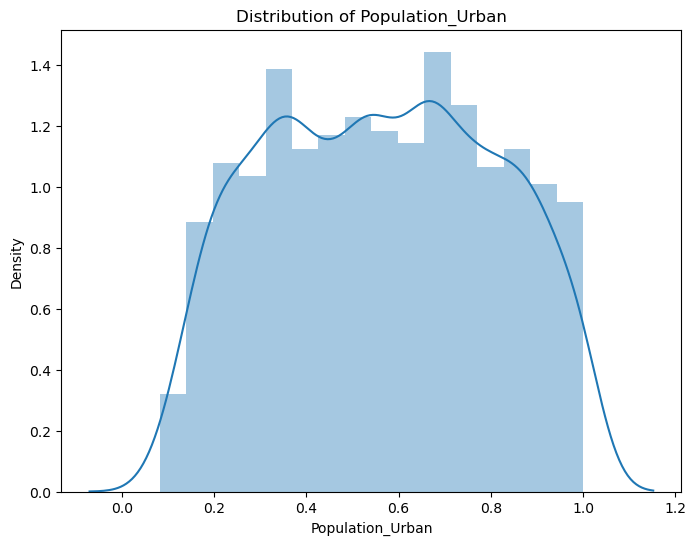

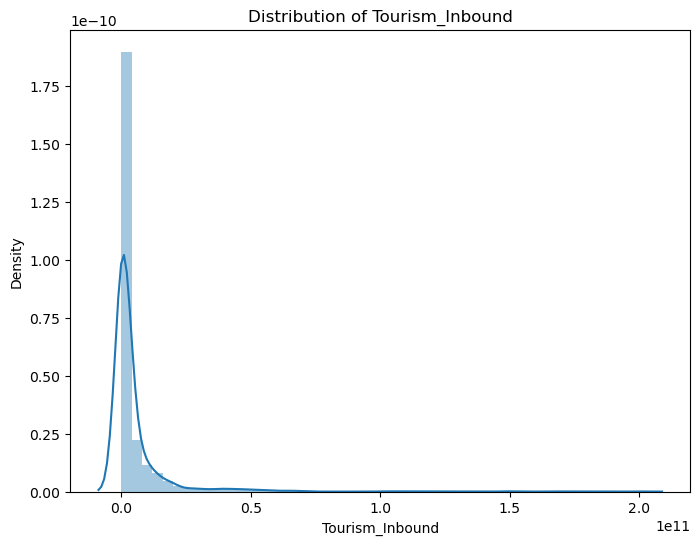

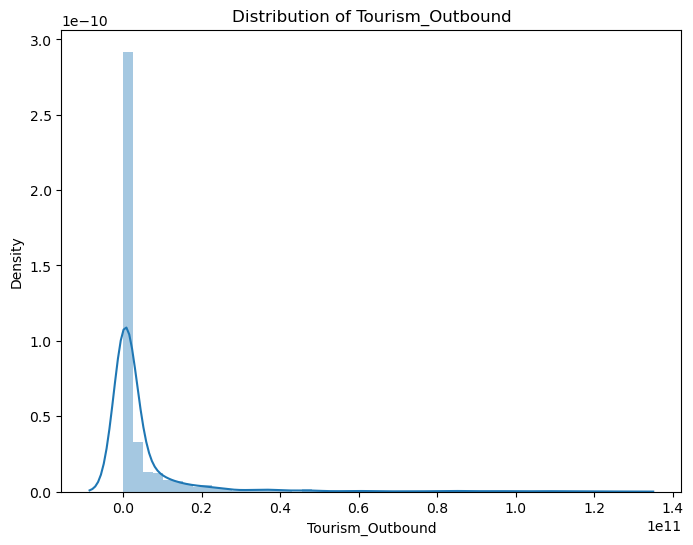

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

data1 = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
         'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
         'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
         'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
         'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
         'Number_of_Records', 'Population_0-14', 'Population_15-64',
         'Population_65+', 'Population_Total', 'Population_Urban',
         'Tourism_Inbound', 'Tourism_Outbound']

for column in data1:
    plt.figure(figsize=(8, 6))
    sns.distplot(data[column])
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)  # Set xlabel as the column name
    plt.ylabel("Density")  # Set ylabel as "Density"
    plt.show()


In [21]:
import pandas as pd

# Assuming 'data' is your DataFrame
selected_columns = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
                    'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
                    'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
                    'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
                    'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
                    'Number_of_Records', 'Population_0-14', 'Population_15-64',
                    'Population_65+', 'Population_Total', 'Population_Urban',
                    'Tourism_Inbound', 'Tourism_Outbound']

for column in selected_columns:
    kurtosis_value = data[column].kurtosis()
    if kurtosis_value == 3:
        kurtosis_type = "\033[94mMesokurtic\033[0m"  # Blue color
    elif kurtosis_value > 3:
        kurtosis_type = "\033[92mLeptokurtic\033[0m"  # Green color
    else:
        kurtosis_type = "\033[91mPlatykurtic\033[0m"  # Red color
    print(f"Kurtosis of {column}: {kurtosis_value}, Kurtosis Type: {kurtosis_type}")


Kurtosis of Birth_Rate: -0.683573092601768, Kurtosis Type: Platykurtic
Kurtosis of Business_Tax_Rate: 21.82660156057662, Kurtosis Type: Leptokurtic
Kurtosis of CO2_Emissions: 83.08072061737991, Kurtosis Type: Leptokurtic
Kurtosis of Days_to_Start_Business: 77.66193036605749, Kurtosis Type: Leptokurtic
Kurtosis of Ease_of_Business: -1.2005527565572862, Kurtosis Type: Platykurtic
Kurtosis of Energy_Usage: 54.89056894965293, Kurtosis Type: Leptokurtic
Kurtosis of GDP: 105.53278543163829, Kurtosis Type: Leptokurtic
Kurtosis of Health_Exp_%_GDP: 2.9632324659393756, Kurtosis Type: Platykurtic
Kurtosis of Health_Exp/Capita: 8.399443424915667, Kurtosis Type: Leptokurtic
Kurtosis of Hours_to_do_Tax: 30.79232334645546, Kurtosis Type: Leptokurtic
Kurtosis of Infant_Mortality_Rate: 0.17224076104202402, Kurtosis Type: Platykurtic
Kurtosis of Internet_Usage: -0.2723868837460097, Kurtosis Type: Platykurtic
Kurtosis of Lending_Interest: 374.12253857605845, Kurtosis Type: Leptokurtic
Kurtosis of Life_E

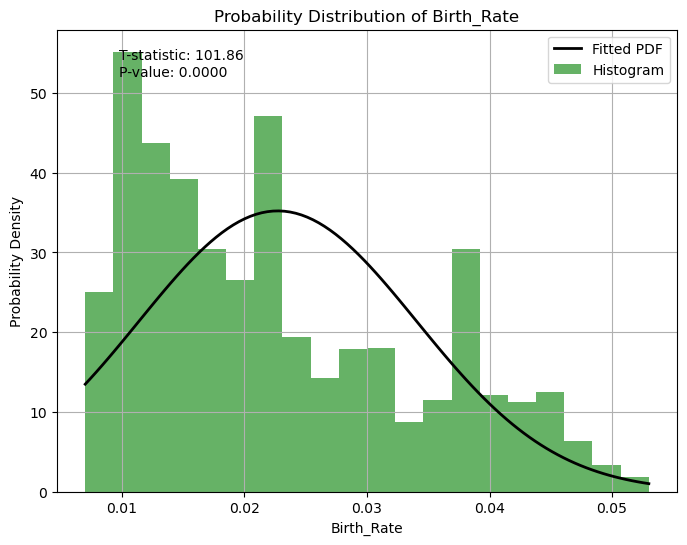

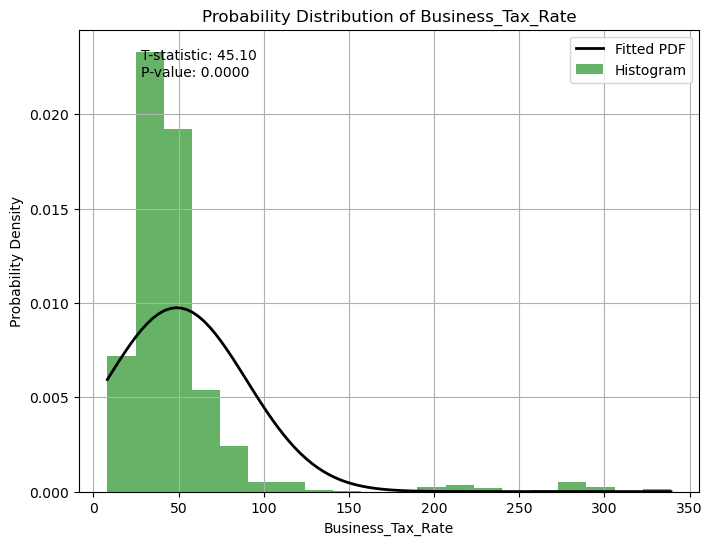

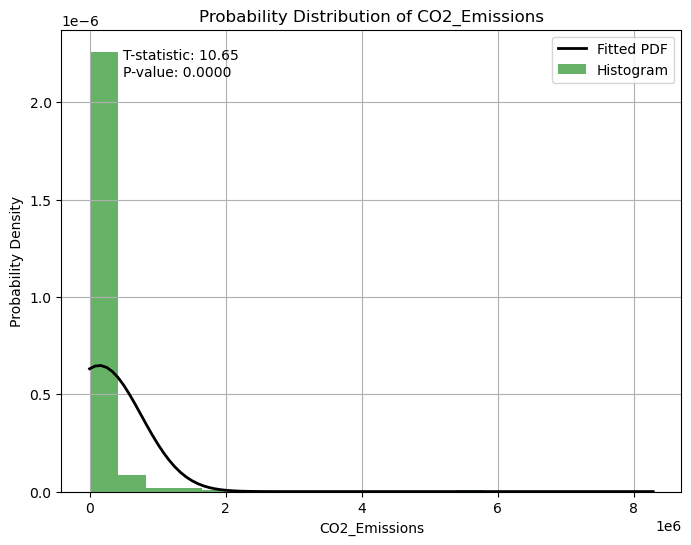

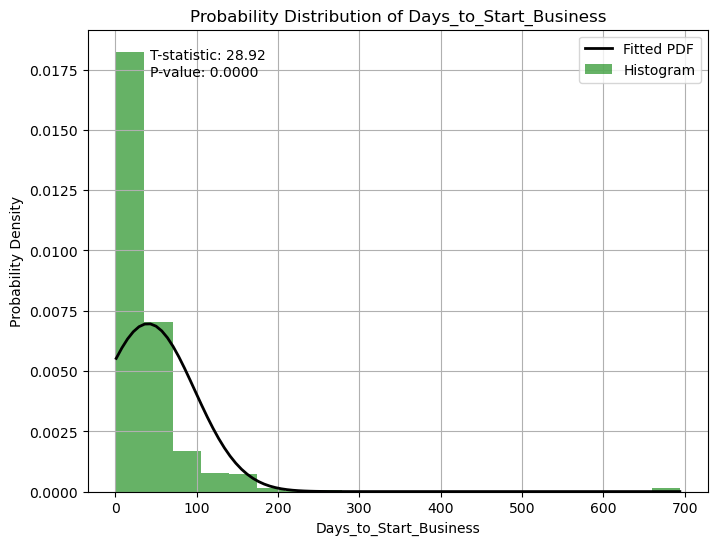

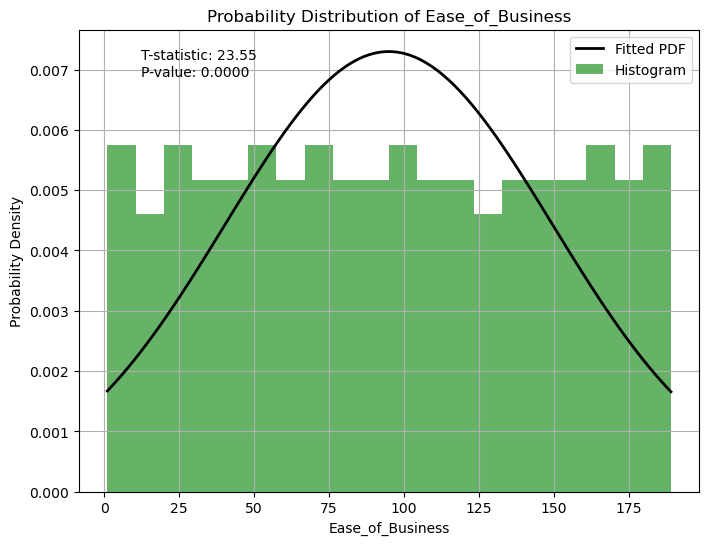

...

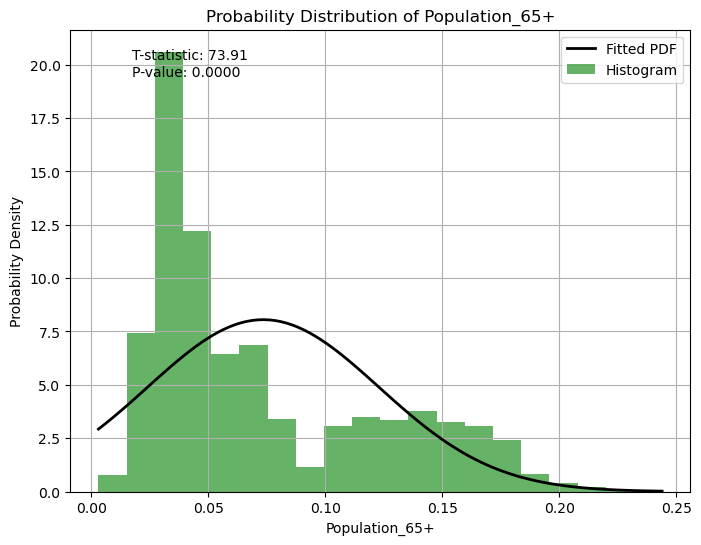

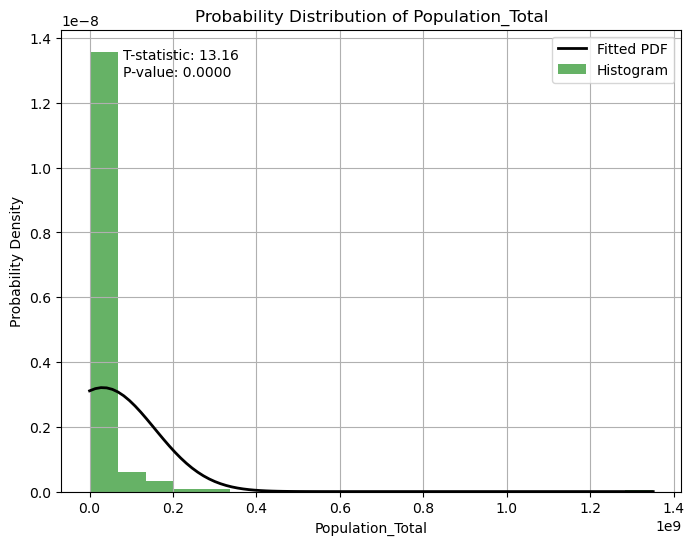

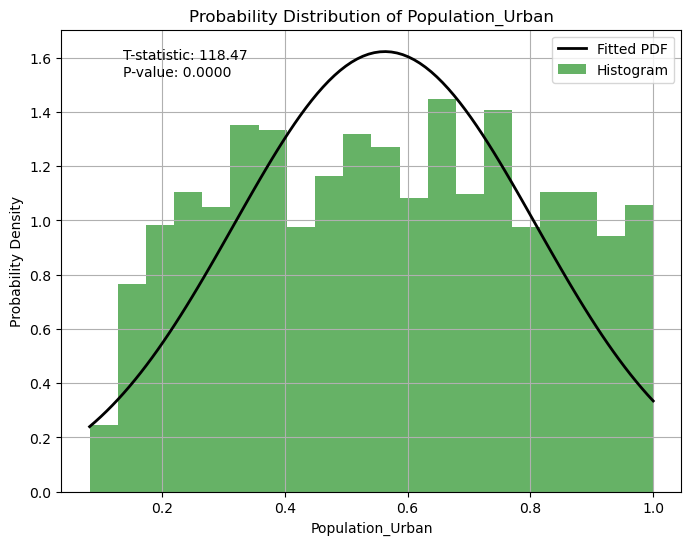

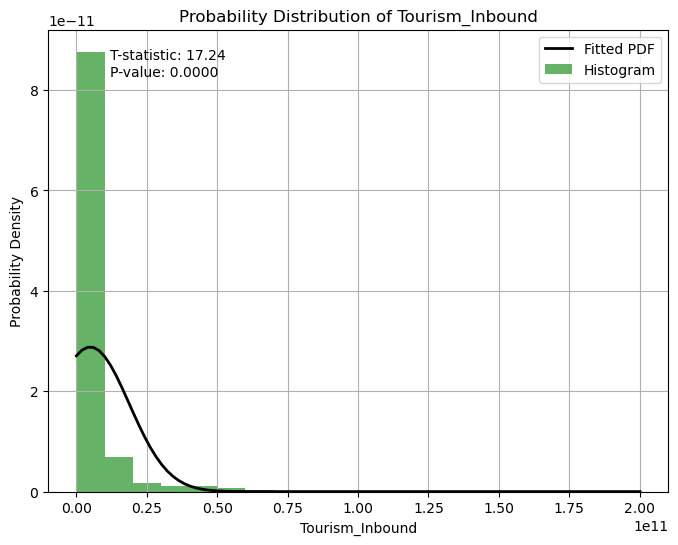

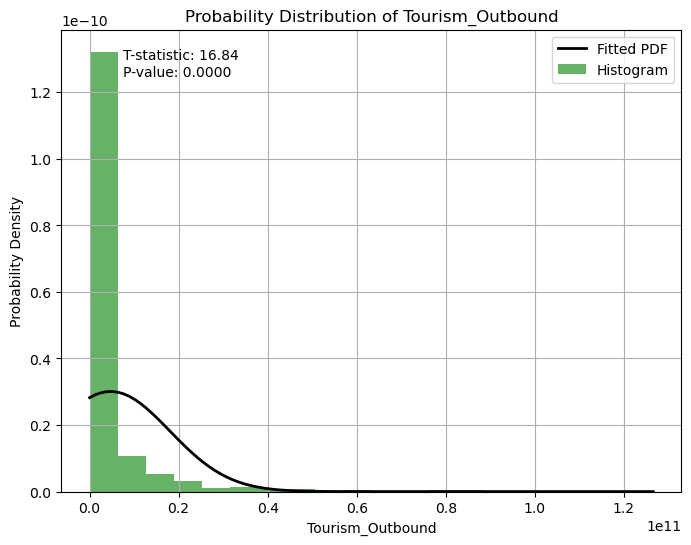

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

data1 = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
         'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
         'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
         'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
         'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
         'Number_of_Records', 'Population_0-14', 'Population_15-64',
         'Population_65+', 'Population_Total', 'Population_Urban',
         'Tourism_Inbound', 'Tourism_Outbound']

# Define the population mean for comparison
population_mean = 0  # Change this to the desired population mean

for column in data1:
    plt.figure(figsize=(8, 6))
    # Perform the t-test
    t_statistic, p_value = stats.ttest_1samp(data[column].dropna(), population_mean)
    
    # Fit a probability distribution to the data
    dist = getattr(stats, 'norm')  # You can choose a different distribution if desired
    params = dist.fit(data[column].dropna())  # Fit the distribution to the data
    # Generate random numbers from the fitted distribution
    rv = dist(*params)
    x = np.linspace(data[column].min(), data[column].max(), 100)
    plt.plot(x, rv.pdf(x), 'k-', lw=2, label='Fitted PDF')
    
    # Plot histogram of the data
    plt.hist(data[column].dropna(), bins=20, density=True, alpha=0.6, color='g', label='Histogram')
    
    # Display t-test results
    plt.text(0.1, 0.9, f"T-statistic: {t_statistic:.2f}\nP-value: {p_value:.4f}", transform=plt.gca().transAxes)
    
    plt.title(f"Probability Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Probability Density")
    plt.legend()
    plt.grid(True)
    plt.show()


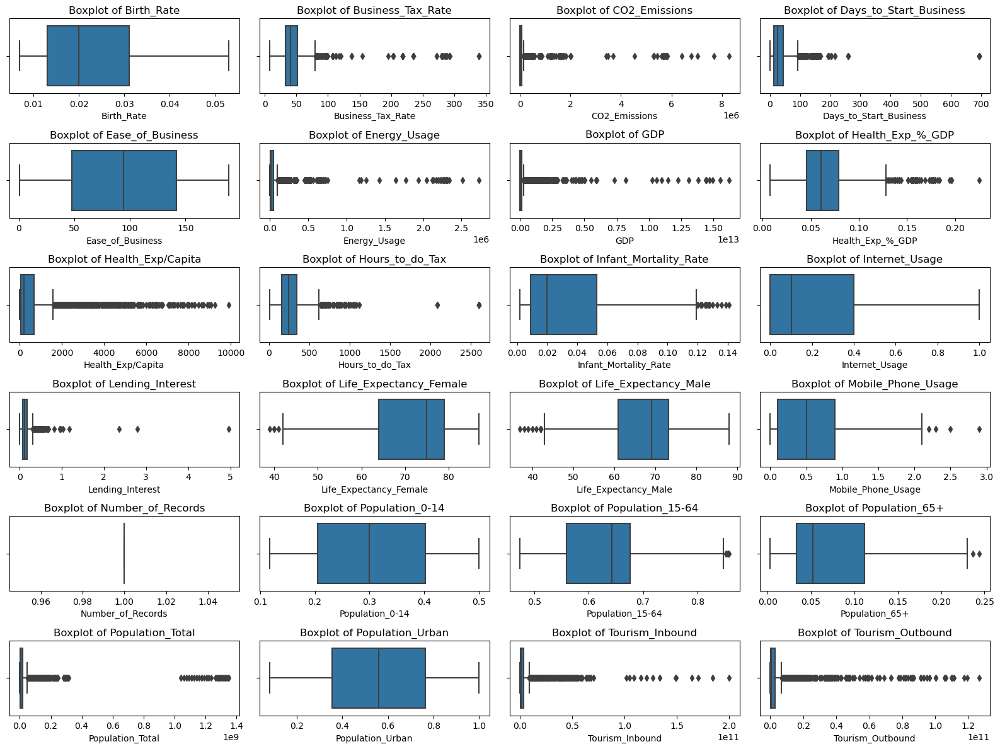

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

data1 = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
         'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
         'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
         'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
         'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
         'Number_of_Records', 'Population_0-14', 'Population_15-64',
         'Population_65+', 'Population_Total', 'Population_Urban',
         'Tourism_Inbound', 'Tourism_Outbound']

# Calculate grid dimensions
num_cols = 4
num_rows = (len(data1) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 12))

# Flatten axes in case num_rows > 1
axes = axes.flatten()

# Plot each feature
for i, column in enumerate(data1):
    sns.boxplot(x=data[column], ax=axes[i])
    axes[i].set_title(f'Boxplot of {column}')
    axes[i].set_xlabel(column)

# Remove any empty subplots
for i in range(len(data1), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


In [24]:
import pandas as pd
from pivottablejs import pivot_ui

pivot_ui(data)


In [25]:
# Replace missing values by mean for selected columns
mean_fill_cols = ['Business_Tax_Rate', 'Ease_of_Business', 'Health_Exp_%_GDP', 'Hours_to_do_Tax', 'Population_0-14']

data[mean_fill_cols] = data[mean_fill_cols].fillna(data[mean_fill_cols].mean())

# Replace missing values by median for other columns
median_fill_cols = ['Birth_Rate', 'CO2_Emissions', 'Days_to_Start_Business', 'Energy_Usage', 'Health_Exp/Capita',
                    'GDP', 'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest', 'Life_Expectancy_Female',
                    'Life_Expectancy_Male', 'Mobile_Phone_Usage', 'Tourism_Inbound', 'Tourism_Outbound',
                    'Population_15-64', 'Population_65+', 'Population_Total', 'Population_Urban']

data[median_fill_cols] = data[median_fill_cols].fillna(data[median_fill_cols].median())


In [26]:
data

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,...,Life_Expectancy_Male,Mobile_Phone_Usage,Number_of_Records,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,48.966901,87931.0,Algeria,26.0,94.875676,26998.0,5.479006e+10,0.03500,60.0,...,67.0,0.0,1,0.342000,0.6190,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050,48.966901,9542.0,Angola,26.0,94.875676,7499.0,9.129595e+09,0.03400,22.0,...,44.0,0.0,1,0.476000,0.4990,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043,48.966901,1617.0,Benin,26.0,94.875676,1983.0,2.359122e+09,0.04300,15.0,...,53.0,0.0,1,0.454000,0.5170,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027,48.966901,4276.0,Botswana,26.0,94.875676,1836.0,5.788312e+09,0.04700,152.0,...,49.0,0.1,1,0.383000,0.5870,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046,48.966901,1041.0,Burkina Faso,26.0,94.875676,14338.0,2.610959e+09,0.05100,12.0,...,49.0,0.0,1,0.468000,0.5050,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,Turks and Caicos Islands,26.0,94.875676,14338.0,1.507975e+10,0.06417,193.0,...,69.0,0.5,1,0.303051,0.6425,0.052,32427,0.911,6.885000e+08,4.560000e+08
2700,0.013,46.400000,8529.0,United States,5.0,4.000000,2132446.0,1.624460e+13,0.17900,8895.0,...,76.0,1.0,1,0.196000,0.6670,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015,41.900000,8529.0,Uruguay,7.0,85.000000,14338.0,5.000435e+10,0.08900,1308.0,...,74.0,1.5,1,0.220000,0.6390,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.900000,8529.0,"Venezuela, RB",144.0,180.000000,14338.0,3.812862e+11,0.04600,593.0,...,72.0,1.0,1,0.288000,0.6520,0.060,29954782,0.889,9.040000e+08,3.202000e+09


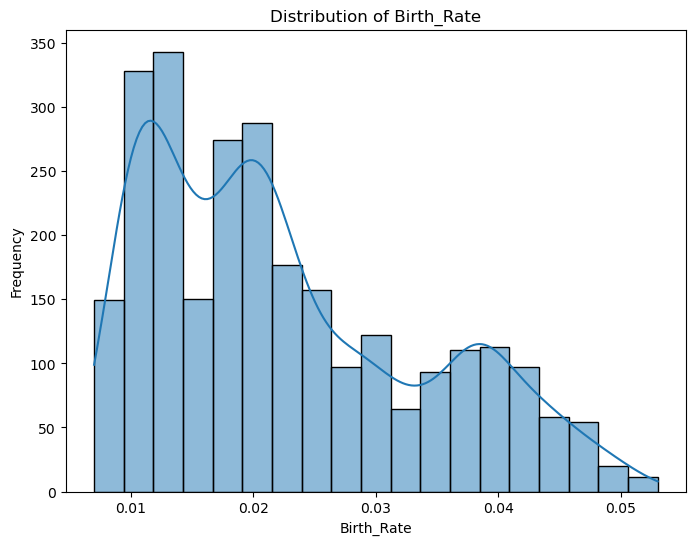

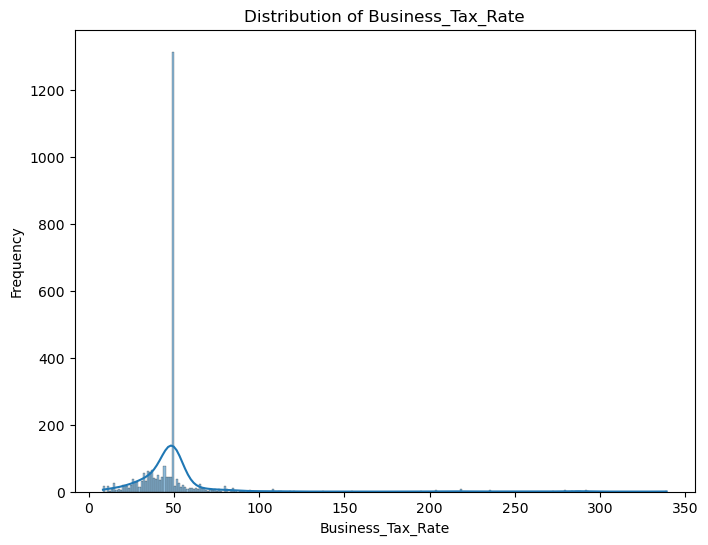

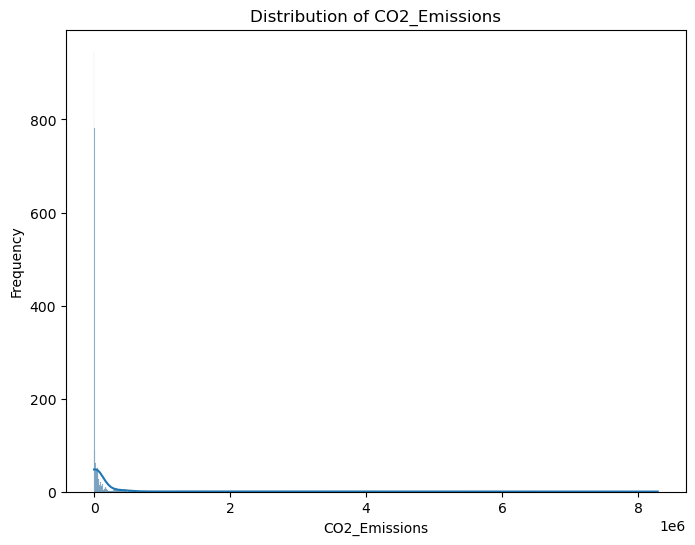

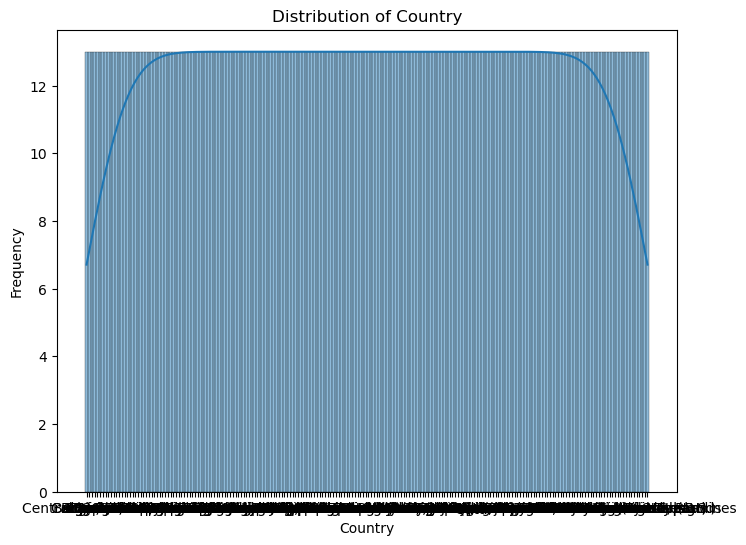

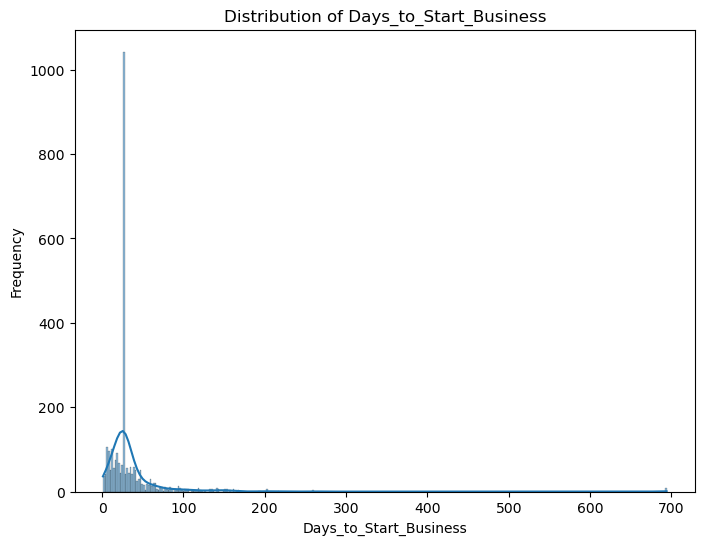

...

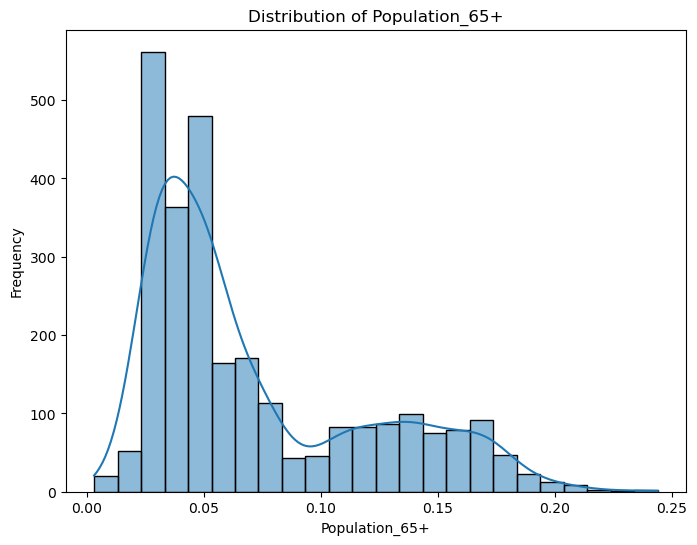

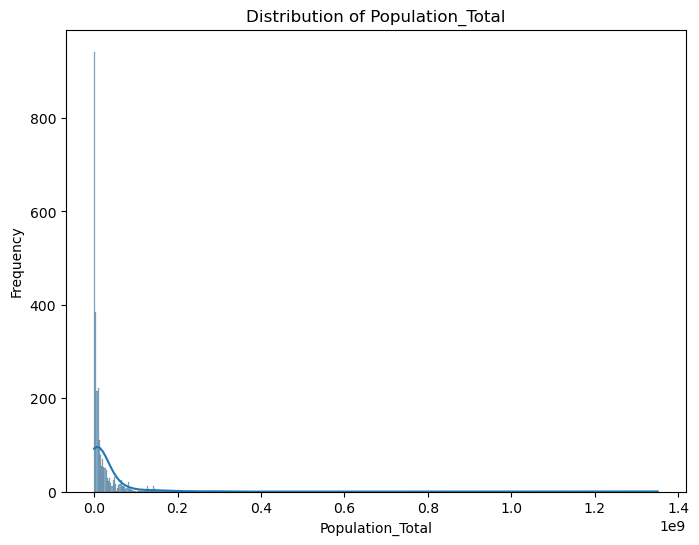

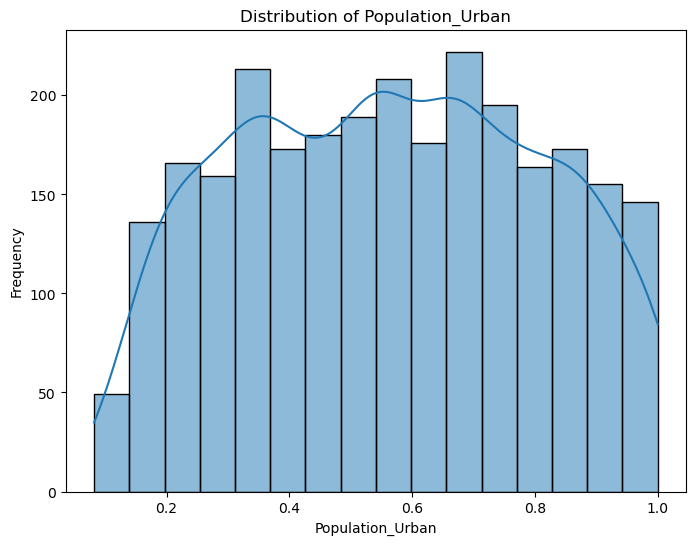

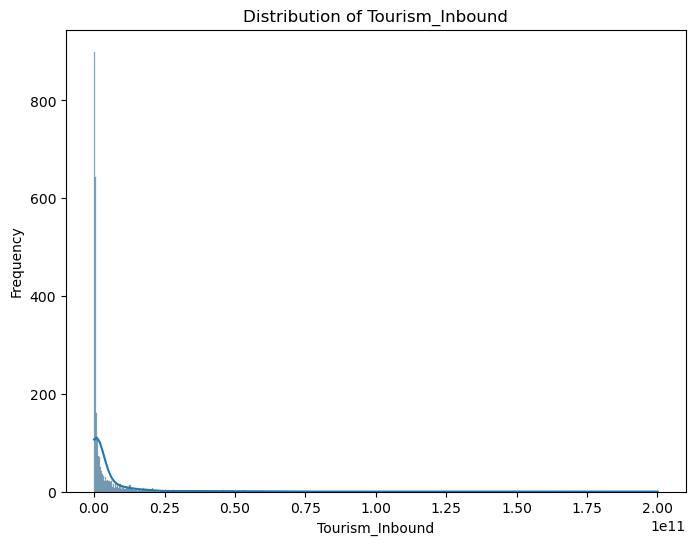

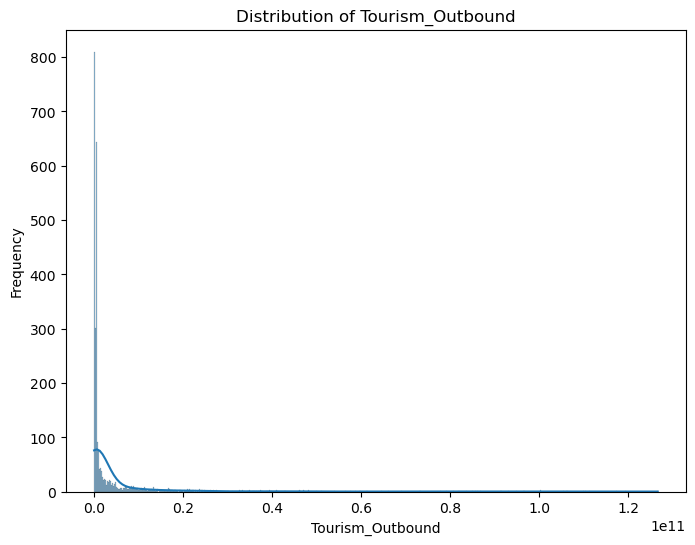

In [27]:
for column in data:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[column], kde=True)  # Use histplot instead of distplot for the histogram
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)  # Set xlabel as the column name
    plt.ylabel("Frequency")  # Set ylabel as "Frequency" for a histogram
    plt.show()


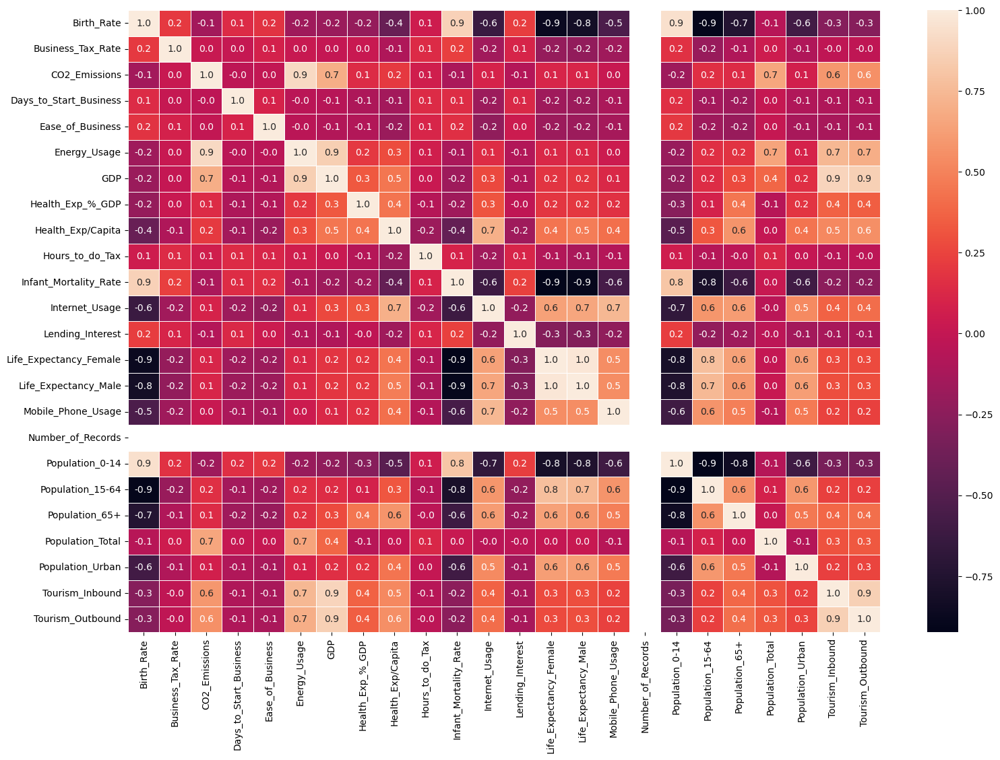

In [28]:
#Heatmap(test)
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

In [29]:
data.isna().sum()

Birth_Rate                0
Business_Tax_Rate         0
CO2_Emissions             0
Country                   0
Days_to_Start_Business    0
Ease_of_Business          0
Energy_Usage              0
GDP                       0
Health_Exp_%_GDP          0
Health_Exp/Capita         0
Hours_to_do_Tax           0
Infant_Mortality_Rate     0
Internet_Usage            0
Lending_Interest          0
Life_Expectancy_Female    0
Life_Expectancy_Male      0
Mobile_Phone_Usage        0
Number_of_Records         0
Population_0-14           0
Population_15-64          0
Population_65+            0
Population_Total          0
Population_Urban          0
Tourism_Inbound           0
Tourism_Outbound          0
dtype: int64

In [30]:
"""import matplotlib.pyplot as plt

import seaborn as sns

# Assuming 'data' is your DataFrame
sns.pairplot(data[data1])
plt.show()
"""

"import matplotlib.pyplot as plt\n\nimport seaborn as sns\n\n# Assuming 'data' is your DataFrame\nsns.pairplot(data[data1])\nplt.show()\n"

In [31]:

# Calculate the IQR for each numerical column
Q1 = data[data1].quantile(0.25)
Q3 = data[data1].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers with values derived from IQR
for column in data1:
    data.loc[data[column] < lower_bound[column], column] = Q1[column] - 1.5 * IQR[column]
    data.loc[data[column] > upper_bound[column], column] = Q3[column] + 1.5 * IQR[column]

# Display the first few rows of the modified DataFrame
pd.DataFrame(data)


,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,...,Life_Expectancy_Male,Mobile_Phone_Usage,Number_of_Records,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,48.966901,87931.0,Algeria,26.000,94.875676,26998.000,5.479006e+10,0.03500,60.000,...,67.0,0.0,1,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08,1.930000e+08
1,0.050,48.966901,9542.0,Angola,26.000,94.875676,7499.000,9.129595e+09,0.03400,22.000,...,44.0,0.0,1,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07,1.460000e+08
2,0.043,48.966901,1617.0,Benin,26.000,94.875676,1983.000,2.359122e+09,0.04300,15.000,...,53.0,0.0,1,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07,5.000000e+07
3,0.027,48.966901,4276.0,Botswana,26.000,94.875676,1836.000,5.788312e+09,0.04700,152.000,...,49.0,0.1,1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08,2.090000e+08
4,0.046,48.966901,1041.0,Burkina Faso,26.000,94.875676,14338.000,2.610959e+09,0.05100,12.000,...,49.0,0.0,1,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,Turks and Caicos Islands,26.000,94.875676,14338.000,1.507975e+10,0.06417,193.000,...,69.0,0.5,1,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08,4.560000e+08
2700,0.013,46.400000,8529.0,United States,5.000,94.875676,46913.625,2.213750e+11,0.11800,1291.125,...,76.0,1.0,1,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09,4.058250e+09
2701,0.015,41.900000,8529.0,Uruguay,7.000,94.875676,14338.000,5.000435e+10,0.08900,1291.125,...,74.0,1.5,1,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.817252,8529.0,"Venezuela, RB",55.625,94.875676,14338.000,2.213750e+11,0.04600,593.000,...,72.0,1.0,1,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08,3.202000e+09


In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth_Rate              2704 non-null   float64
 1   Business_Tax_Rate       2704 non-null   float64
 2   CO2_Emissions           2704 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days_to_Start_Business  2704 non-null   float64
 5   Ease_of_Business        2704 non-null   float64
 6   Energy_Usage            2704 non-null   float64
 7   GDP                     2704 non-null   float64
 8   Health_Exp_%_GDP        2704 non-null   float64
 9   Health_Exp/Capita       2704 non-null   float64
 10  Hours_to_do_Tax         2704 non-null   float64
 11  Infant_Mortality_Rate   2704 non-null   float64
 12  Internet_Usage          2704 non-null   float64
 13  Lending_Interest        2704 non-null   float64
 14  Life_Expectancy_Female  2704 non-null   

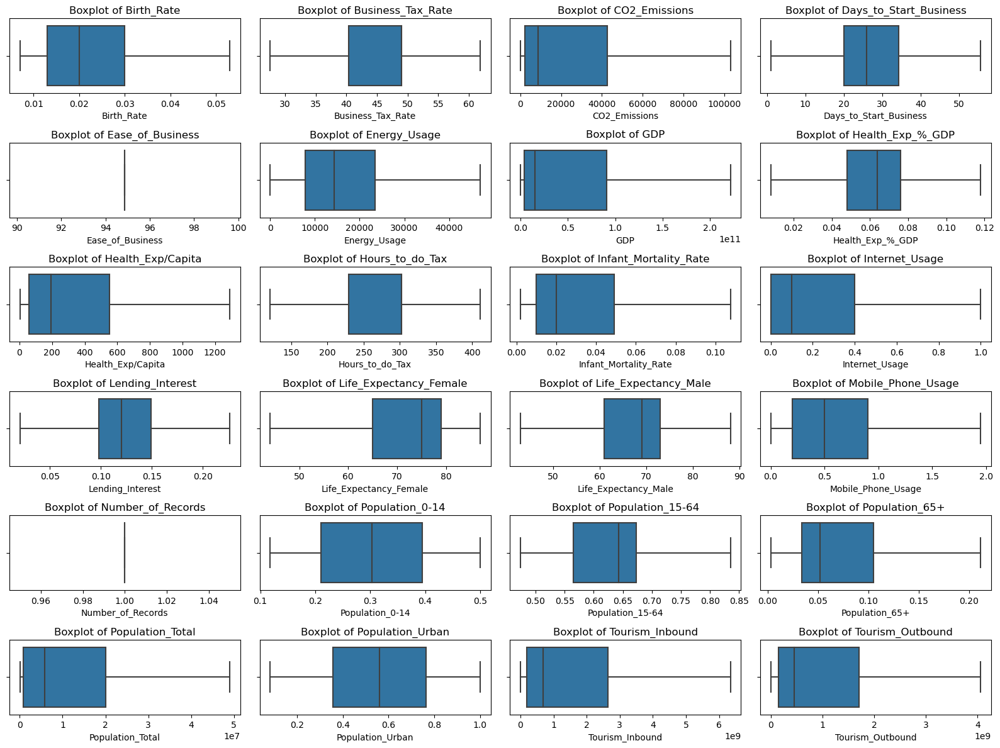

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

data1 = ['Birth_Rate', 'Business_Tax_Rate', 'CO2_Emissions',
         'Days_to_Start_Business', 'Ease_of_Business', 'Energy_Usage', 'GDP',
         'Health_Exp_%_GDP', 'Health_Exp/Capita', 'Hours_to_do_Tax',
         'Infant_Mortality_Rate', 'Internet_Usage', 'Lending_Interest',
         'Life_Expectancy_Female', 'Life_Expectancy_Male', 'Mobile_Phone_Usage',
         'Number_of_Records', 'Population_0-14', 'Population_15-64',
         'Population_65+', 'Population_Total', 'Population_Urban',
         'Tourism_Inbound', 'Tourism_Outbound']

# Calculate grid dimensions
num_cols = 4
num_rows = (len(data1) + num_cols - 1) // num_cols

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 12))

# Flatten axes in case num_rows > 1
axes = axes.flatten()

# Plot each feature
for i, column in enumerate(data1):
    sns.boxplot(x=data[column], ax=axes[i])
    axes[i].set_title(f'Boxplot of {column}')
    axes[i].set_xlabel(column)

# Remove any empty subplots
for i in range(len(data1), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


In [34]:
import plotly.express as px

# Assuming 'data' is your DataFrame
# Replace 'Birth_Rate' and 'CO2_Emissions' with actual column names
fig = px.scatter(data, x='Birth_Rate', y='CO2_Emissions', title='Scatter Plot',
                 labels={'Birth_Rate': 'Birth Rate', 'CO2_Emissions': 'CO2 Emissions'},
                 color_discrete_sequence=['red'], trendline='ols')
fig.show()


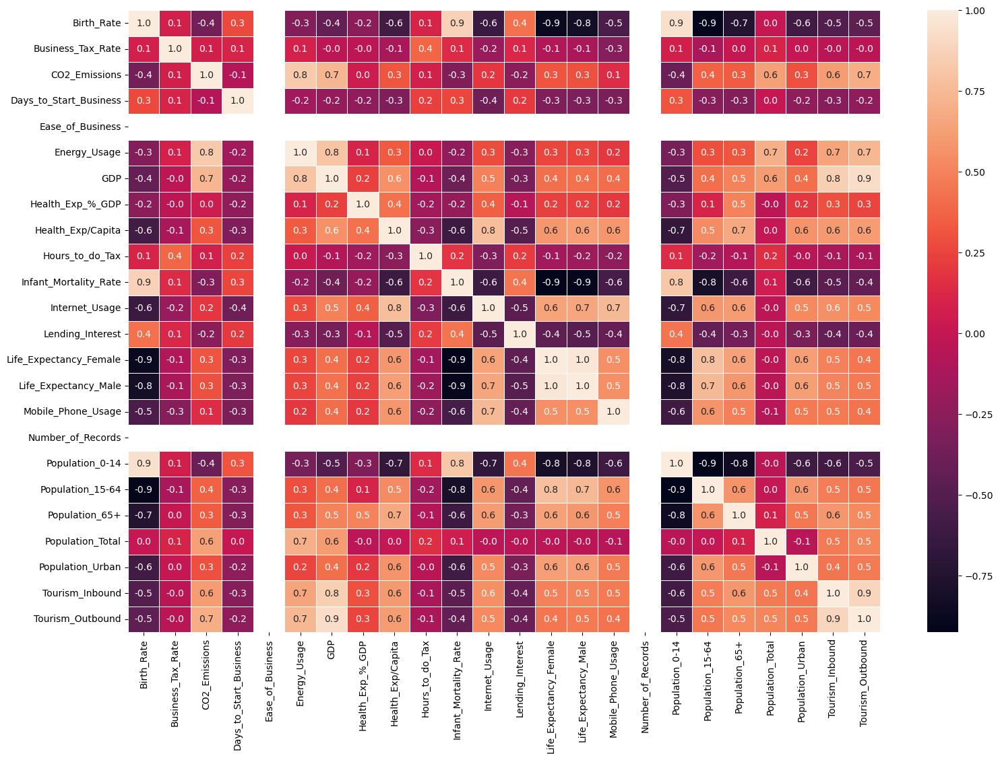

In [35]:
#Heatmap(test)
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

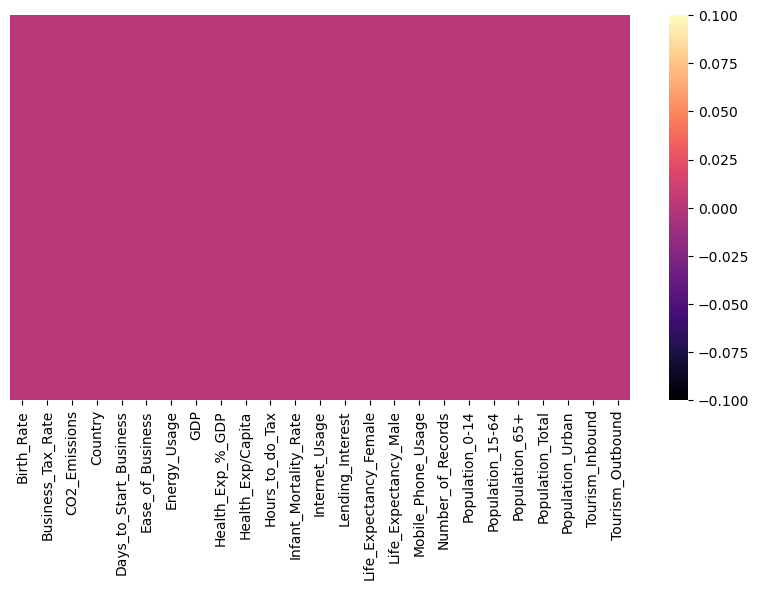

In [36]:
#visualizing the null values for each attribute
plt.figure(figsize=(10,5))
sns.heatmap(data.isnull(),cmap='magma',yticklabels=False,cbar=True)
plt.show()

In [37]:
data["Ease_of_Business"].value_counts()

94.875676    2704
Name: Ease_of_Business, dtype: int64

In [38]:
data["Number_of_Records"].value_counts() 

1    2704
Name: Number_of_Records, dtype: int64

In [39]:
data["Days_to_Start_Business"].value_counts()

26.000    1017
55.625     340
6.000       54
13.000      54
18.000      53
7.000       51
9.000       50
12.000      48
8.000       46
35.000      44
31.000      43
16.000      41
25.000      41
39.000      39
19.000      39
20.000      37
22.000      36
40.000      35
17.000      33
14.000      31
3.000       30
32.000      30
21.000      30
5.000       28
29.000      27
37.000      27
15.000      26
11.000      26
27.000      26
10.000      24
24.000      21
46.000      20
38.000      20
45.000      19
47.000      17
41.000      15
34.000      14
43.000      14
28.000      14
36.000      14
33.000      14
30.000      14
4.000       13
48.000      13
51.000      11
50.000      11
44.000      11
42.000      10
23.000       9
49.000       6
52.000       5
1.000        5
54.000       3
2.000        3
55.000       1
53.000       1
Name: Days_to_Start_Business, dtype: int64

In [40]:
data["Mobile_Phone_Usage"].value_counts()

0.00    396
0.50    300
0.10    268
0.20    199
0.60    165
0.30    164
0.80    164
1.00    153
0.90    150
1.10    140
0.40    139
0.70    134
1.20    123
1.30     64
1.40     42
1.50     36
1.60     28
1.70     11
1.95     11
1.90     10
1.80      7
Name: Mobile_Phone_Usage, dtype: int64

In [41]:
## Drop "Number of Records" column
data = data.drop(['Number_of_Records'],axis=1)

In [42]:
 ## Drop "Ease_of_Business" column
data = data.drop(['Ease_of_Business'],axis=1)

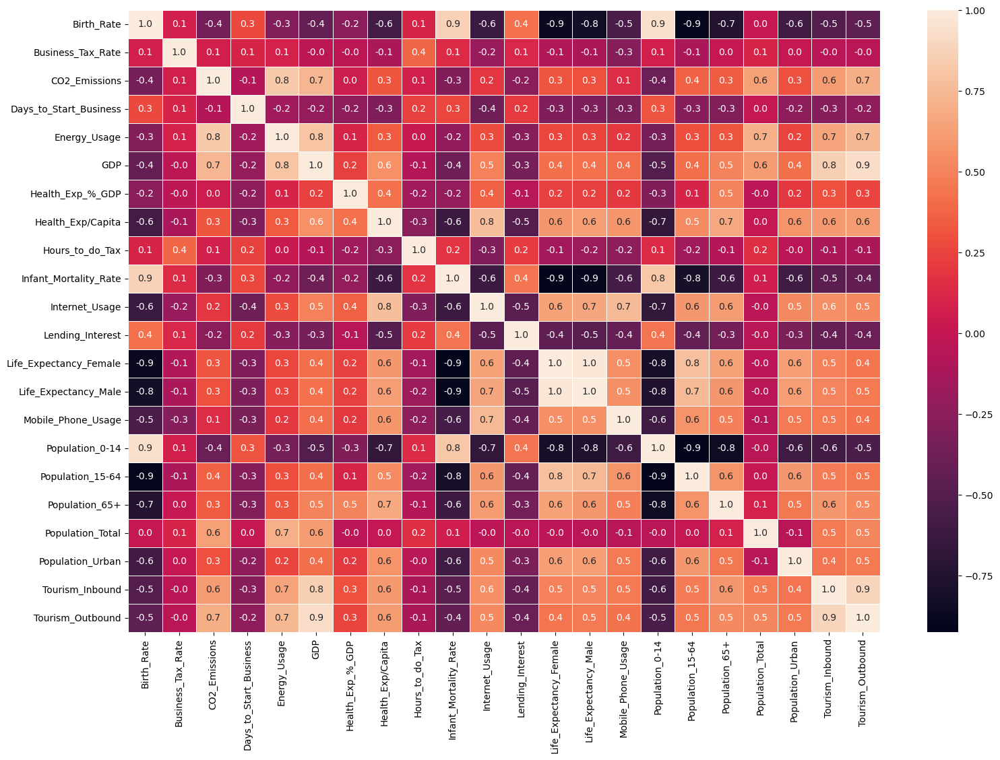

In [43]:
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

In [44]:
data = data.drop(["Tourism_Outbound"], axis=1)

In [45]:
data = data.drop(["Life_Expectancy_Male"], axis=1)

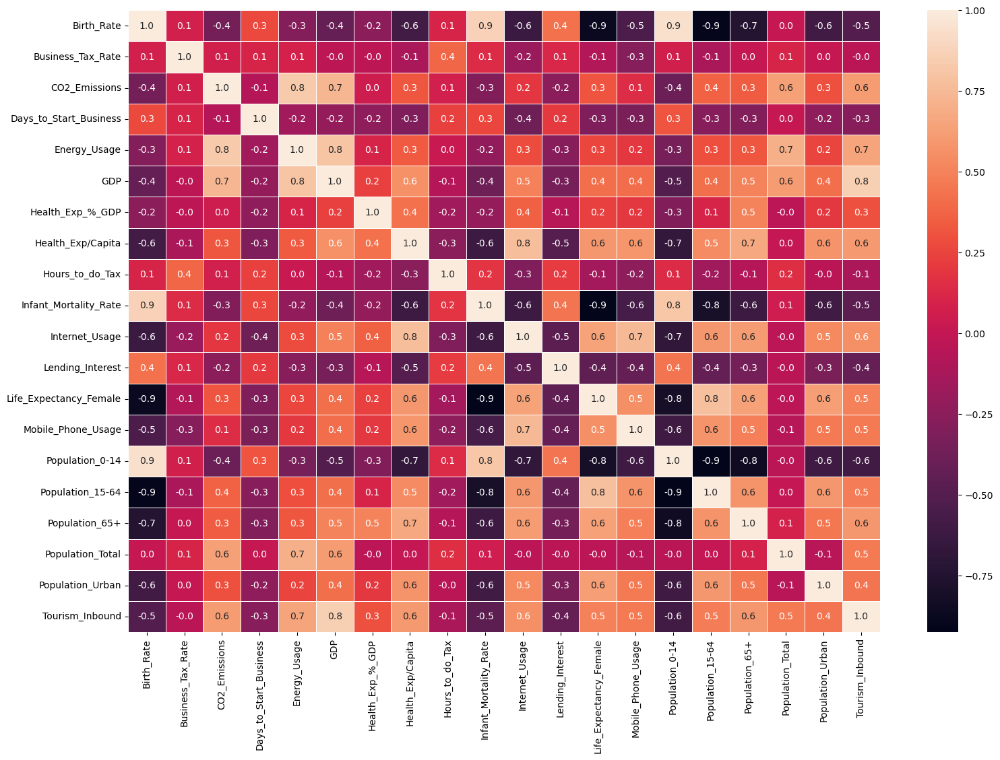

In [46]:
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(data.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth_Rate              2704 non-null   float64
 1   Business_Tax_Rate       2704 non-null   float64
 2   CO2_Emissions           2704 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days_to_Start_Business  2704 non-null   float64
 5   Energy_Usage            2704 non-null   float64
 6   GDP                     2704 non-null   float64
 7   Health_Exp_%_GDP        2704 non-null   float64
 8   Health_Exp/Capita       2704 non-null   float64
 9   Hours_to_do_Tax         2704 non-null   float64
 10  Infant_Mortality_Rate   2704 non-null   float64
 11  Internet_Usage          2704 non-null   float64
 12  Lending_Interest        2704 non-null   float64
 13  Life_Expectancy_Female  2704 non-null   float64
 14  Mobile_Phone_Usage      2704 non-null   

In [48]:
Data_Kmean = data.copy() # kmeans
Data_Kmean

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,Hours_to_do_Tax,...,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound
0,0.020,48.966901,87931.0,Algeria,26.000,26998.000,5.479006e+10,0.03500,60.000,302.068503,...,0.0,0.1000,71.0,0.0,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08
1,0.050,48.966901,9542.0,Angola,26.000,7499.000,9.129595e+09,0.03400,22.000,302.068503,...,0.0,0.2265,47.0,0.0,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07
2,0.043,48.966901,1617.0,Benin,26.000,1983.000,2.359122e+09,0.04300,15.000,302.068503,...,0.0,0.1200,57.0,0.0,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07
3,0.027,48.966901,4276.0,Botswana,26.000,1836.000,5.788312e+09,0.04700,152.000,302.068503,...,0.0,0.1550,52.0,0.1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08
4,0.046,48.966901,1041.0,Burkina Faso,26.000,14338.000,2.610959e+09,0.05100,12.000,302.068503,...,0.0,0.1200,52.0,0.0,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,Turks and Caicos Islands,26.000,14338.000,1.507975e+10,0.06417,193.000,302.068503,...,0.1,0.1200,75.0,0.5,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08
2700,0.013,46.400000,8529.0,United States,5.000,46913.625,2.213750e+11,0.11800,1291.125,175.000000,...,0.8,0.0330,81.0,1.0,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09
2701,0.015,41.900000,8529.0,Uruguay,7.000,14338.000,5.000435e+10,0.08900,1291.125,310.000000,...,0.5,0.1120,80.0,1.5,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09
2702,0.020,61.817252,8529.0,"Venezuela, RB",55.625,14338.000,2.213750e+11,0.04600,593.000,410.921257,...,0.5,0.1640,78.0,1.0,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08


In [49]:
# Assuming 'df' is your DataFrame containing the data
country_column = Data_Kmean['Country']  # Extract the 'Country' column
Data_Kmean.drop(columns=['Country'], inplace=True)  # Drop the 'Country' column from the DataFrame
Data_Kmean['Country'] = country_column  # Add the 'Country' column at the end


In [50]:
Data_Kmean

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Lending_Interest,Life_Expectancy_Female,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,Country
0,0.020,48.966901,87931.0,26.000,26998.000,5.479006e+10,0.03500,60.000,302.068503,0.0340,...,0.1000,71.0,0.0,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08,Algeria
1,0.050,48.966901,9542.0,26.000,7499.000,9.129595e+09,0.03400,22.000,302.068503,0.1075,...,0.2265,47.0,0.0,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07,Angola
2,0.043,48.966901,1617.0,26.000,1983.000,2.359122e+09,0.04300,15.000,302.068503,0.0900,...,0.1200,57.0,0.0,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07,Benin
3,0.027,48.966901,4276.0,26.000,1836.000,5.788312e+09,0.04700,152.000,302.068503,0.0540,...,0.1550,52.0,0.1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08,Botswana
4,0.046,48.966901,1041.0,26.000,14338.000,2.610959e+09,0.05100,12.000,302.068503,0.0960,...,0.1200,52.0,0.0,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07,Burkina Faso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,26.000,14338.000,1.507975e+10,0.06417,193.000,302.068503,0.0200,...,0.1200,75.0,0.5,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08,Turks and Caicos Islands
2700,0.013,46.400000,8529.0,5.000,46913.625,2.213750e+11,0.11800,1291.125,175.000000,0.0060,...,0.0330,81.0,1.0,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09,United States
2701,0.015,41.900000,8529.0,7.000,14338.000,5.000435e+10,0.08900,1291.125,310.000000,0.0100,...,0.1120,80.0,1.5,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09,Uruguay
2702,0.020,61.817252,8529.0,55.625,14338.000,2.213750e+11,0.04600,593.000,410.921257,0.0130,...,0.1640,78.0,1.0,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08,"Venezuela, RB"


# Perfroming Model Encoding for the Country column

In [51]:
data["Country"].unique()


array(['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Burundi', 'Cameroon', 'Central African Republic', 'Chad',
       'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire",
       'Djibouti', 'Egypt, Arab Rep.', 'Equatorial Guinea', 'Eritrea',
       'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea',
       'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Libya',
       'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius',
       'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda',
       'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone',
       'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Swaziland',
       'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe',
       'Afghanistan', 'Armenia', 'Azerbaijan', 'Bangladesh', 'Bhutan',
       'Brunei Darussalam', 'Cambodia', 'China', 'Georgia',
       'Hong Kong SAR, China', 'India', 'Indonesia', 'Japan',
       'Kazakhstan', 'Korea, Dem. Rep.', 'Korea, Rep.', 

In [52]:
Data_Country = data.copy

In [53]:
data

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,Hours_to_do_Tax,...,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound
0,0.020,48.966901,87931.0,Algeria,26.000,26998.000,5.479006e+10,0.03500,60.000,302.068503,...,0.0,0.1000,71.0,0.0,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08
1,0.050,48.966901,9542.0,Angola,26.000,7499.000,9.129595e+09,0.03400,22.000,302.068503,...,0.0,0.2265,47.0,0.0,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07
2,0.043,48.966901,1617.0,Benin,26.000,1983.000,2.359122e+09,0.04300,15.000,302.068503,...,0.0,0.1200,57.0,0.0,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07
3,0.027,48.966901,4276.0,Botswana,26.000,1836.000,5.788312e+09,0.04700,152.000,302.068503,...,0.0,0.1550,52.0,0.1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08
4,0.046,48.966901,1041.0,Burkina Faso,26.000,14338.000,2.610959e+09,0.05100,12.000,302.068503,...,0.0,0.1200,52.0,0.0,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,Turks and Caicos Islands,26.000,14338.000,1.507975e+10,0.06417,193.000,302.068503,...,0.1,0.1200,75.0,0.5,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08
2700,0.013,46.400000,8529.0,United States,5.000,46913.625,2.213750e+11,0.11800,1291.125,175.000000,...,0.8,0.0330,81.0,1.0,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09
2701,0.015,41.900000,8529.0,Uruguay,7.000,14338.000,5.000435e+10,0.08900,1291.125,310.000000,...,0.5,0.1120,80.0,1.5,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09
2702,0.020,61.817252,8529.0,"Venezuela, RB",55.625,14338.000,2.213750e+11,0.04600,593.000,410.921257,...,0.5,0.1640,78.0,1.0,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08


In [54]:
# Create a LabelEncoder object
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

data['COUNTRY']=le.fit_transform(data['Country'])
data['COUNTRY']=data['COUNTRY'].astype(float)

In [55]:
data['COUNTRY'].value_counts().head(60)

2.0      13
5.0      13
191.0    13
195.0    13
197.0    13
14.0     13
86.0     13
87.0     13
90.0     13
94.0     13
101.0    13
105.0    13
141.0    13
151.0    13
158.0    13
182.0    13
196.0    13
205.0    13
3.0      13
10.0     13
62.0     13
65.0     13
74.0     13
97.0     13
120.0    13
181.0    13
180.0    13
171.0    13
125.0    13
88.0     13
89.0     13
91.0     13
100.0    13
104.0    13
109.0    13
110.0    13
111.0    13
113.0    13
119.0    13
126.0    13
166.0    13
128.0    13
134.0    13
140.0    13
148.0    13
149.0    13
152.0    13
153.0    13
156.0    13
160.0    13
165.0    13
124.0    13
135.0    13
136.0    13
150.0    13
75.0     13
78.0     13
79.0     13
80.0     13
92.0     13
Name: COUNTRY, dtype: int64

In [56]:
data = data.drop(['Country'],axis=1)

In [57]:
K_Data = data.copy()  #method for Kmeans

In [58]:
#Using standard scaler
from sklearn.preprocessing import StandardScaler


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X1 = data.iloc[:, 0:21].values

# Standardize the features
scaler = StandardScaler()
DATA_X1 = scaler.fit_transform(X1)

DATA_X1 = data.iloc[:,:]
DATA_X1

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Lending_Interest,Life_Expectancy_Female,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,COUNTRY
0,0.020,48.966901,87931.0,26.000,26998.000,5.479006e+10,0.03500,60.000,302.068503,0.0340,...,0.1000,71.0,0.0,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08,2.0
1,0.050,48.966901,9542.0,26.000,7499.000,9.129595e+09,0.03400,22.000,302.068503,0.1075,...,0.2265,47.0,0.0,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07,5.0
2,0.043,48.966901,1617.0,26.000,1983.000,2.359122e+09,0.04300,15.000,302.068503,0.0900,...,0.1200,57.0,0.0,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07,20.0
3,0.027,48.966901,4276.0,26.000,1836.000,5.788312e+09,0.04700,152.000,302.068503,0.0540,...,0.1550,52.0,0.1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08,25.0
4,0.046,48.966901,1041.0,26.000,14338.000,2.610959e+09,0.05100,12.000,302.068503,0.0960,...,0.1200,52.0,0.0,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,26.000,14338.000,1.507975e+10,0.06417,193.000,302.068503,0.0200,...,0.1200,75.0,0.5,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08,193.0
2700,0.013,46.400000,8529.0,5.000,46913.625,2.213750e+11,0.11800,1291.125,175.000000,0.0060,...,0.0330,81.0,1.0,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09,198.0
2701,0.015,41.900000,8529.0,7.000,14338.000,5.000435e+10,0.08900,1291.125,310.000000,0.0100,...,0.1120,80.0,1.5,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09,199.0
2702,0.020,61.817252,8529.0,55.625,14338.000,2.213750e+11,0.04600,593.000,410.921257,0.0130,...,0.1640,78.0,1.0,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08,202.0


In [59]:
from sklearn.decomposition import PCA
PCA1 = PCA()

Data_MinMax = PCA1.fit_transform(DATA_X1)
DATA_X1

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Energy_Usage,GDP,Health_Exp_%_GDP,Health_Exp/Capita,Hours_to_do_Tax,Infant_Mortality_Rate,...,Lending_Interest,Life_Expectancy_Female,Mobile_Phone_Usage,Population_0-14,Population_15-64,Population_65+,Population_Total,Population_Urban,Tourism_Inbound,COUNTRY
0,0.020,48.966901,87931.0,26.000,26998.000,5.479006e+10,0.03500,60.000,302.068503,0.0340,...,0.1000,71.0,0.0,0.342000,0.6190,0.039,3.171945e+07,0.599,1.020000e+08,2.0
1,0.050,48.966901,9542.0,26.000,7499.000,9.129595e+09,0.03400,22.000,302.068503,0.1075,...,0.2265,47.0,0.0,0.476000,0.4990,0.025,1.392493e+07,0.324,3.400000e+07,5.0
2,0.043,48.966901,1617.0,26.000,1983.000,2.359122e+09,0.04300,15.000,302.068503,0.0900,...,0.1200,57.0,0.0,0.454000,0.5170,0.029,6.949366e+06,0.383,7.700000e+07,20.0
3,0.027,48.966901,4276.0,26.000,1836.000,5.788312e+09,0.04700,152.000,302.068503,0.0540,...,0.1550,52.0,0.1,0.383000,0.5870,0.029,1.755375e+06,0.532,2.270000e+08,25.0
4,0.046,48.966901,1041.0,26.000,14338.000,2.610959e+09,0.05100,12.000,302.068503,0.0960,...,0.1200,52.0,0.0,0.468000,0.5050,0.028,1.160794e+07,0.178,2.300000e+07,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.020,48.966901,8529.0,26.000,14338.000,1.507975e+10,0.06417,193.000,302.068503,0.0200,...,0.1200,75.0,0.5,0.303051,0.6425,0.052,3.242700e+04,0.911,6.885000e+08,193.0
2700,0.013,46.400000,8529.0,5.000,46913.625,2.213750e+11,0.11800,1291.125,175.000000,0.0060,...,0.0330,81.0,1.0,0.196000,0.6670,0.136,4.903473e+07,0.811,6.341000e+09,198.0
2701,0.015,41.900000,8529.0,7.000,14338.000,5.000435e+10,0.08900,1291.125,310.000000,0.0100,...,0.1120,80.0,1.5,0.220000,0.6390,0.140,3.395253e+06,0.948,2.222000e+09,199.0
2702,0.020,61.817252,8529.0,55.625,14338.000,2.213750e+11,0.04600,593.000,410.921257,0.0130,...,0.1640,78.0,1.0,0.288000,0.6520,0.060,2.995478e+07,0.889,9.040000e+08,202.0


In [60]:
PCA1.explained_variance_

array([6.64308466e+21, 1.45142416e+18, 1.70267547e+14, 5.69924330e+08,
       4.19851240e+07, 9.38170250e+04, 5.83859877e+03, 3.36124793e+03,
       1.72320873e+02, 6.95299488e+01, 5.97878453e+01, 1.10237783e-01,
       2.96499700e-02, 1.44997855e-02, 4.01128581e-03, 1.66386877e-03,
       1.04212014e-03, 2.72892723e-04, 9.30794472e-05, 7.71366758e-06,
       7.61224048e-07])

In [61]:
var1 = PCA1.explained_variance_ratio_
var1

array([9.99781536e-01, 2.18438745e-04, 2.56251965e-08, 8.57733795e-14,
       6.31874405e-15, 1.41194240e-17, 8.78706736e-19, 5.05866444e-19,
       2.59342212e-20, 1.04642290e-20, 8.99804637e-21, 1.65907415e-23,
       4.46230841e-24, 2.18221182e-24, 6.03696880e-25, 2.50411573e-25,
       1.56838657e-25, 4.10702436e-26, 1.40084189e-26, 1.16090383e-27,
       1.14563909e-28])

In [62]:
# Cumulative variance
cvar1=np.cumsum(np.round(var1,decimals=4)*100)
cvar1# 45   45+16=61   61+5=66 and so on

array([ 99.98, 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
       100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
       100.  , 100.  , 100.  , 100.  , 100.  ])

In [63]:
PCA1.components_ # 23 dimensional components

array([[-5.65070416e-14, -2.70326798e-12,  3.27909589e-07,
        -3.61029950e-11,  1.45274173e-07,  9.99715864e-01,
         6.21483224e-14,  3.07425929e-09, -7.13789950e-11,
        -1.34045574e-13,  1.53014028e-12, -2.05552963e-13,
         5.32071524e-11,  2.28752579e-12, -6.36300083e-13,
         3.41934079e-13,  2.93882449e-13,  1.24940454e-04,
         1.24389986e-12,  2.38364259e-02,  2.74574586e-11],
       [-2.67515683e-12, -2.88581975e-10, -6.01024737e-07,
        -1.96078691e-09, -6.98242530e-07, -2.38362239e-02,
         3.59491337e-12,  8.62925465e-08, -6.13301801e-09,
        -6.04928604e-12,  5.34601442e-11, -9.81447348e-12,
         2.31022499e-09,  8.10990371e-11, -2.53241757e-11,
         1.30410648e-11,  1.23241252e-11, -1.42536691e-03,
         3.31557543e-11,  9.99714861e-01, -6.60188790e-10],
       [ 2.56811905e-10,  1.00232332e-07,  6.40638879e-04,
         1.68476553e-07,  3.03871916e-04, -1.58880710e-04,
        -3.34498553e-10, -1.37303582e-05,  1.45912387e

# Model Building Of Hierarchy

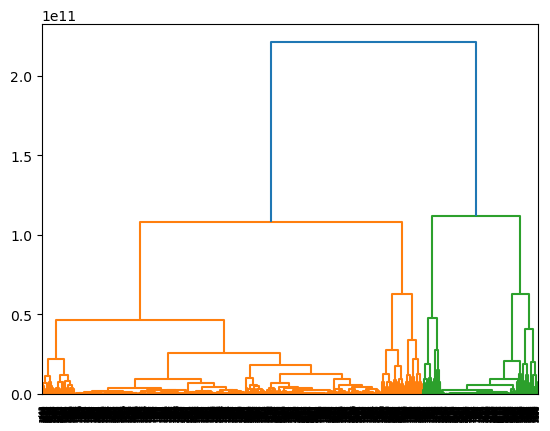

In [65]:
#creating dendogram 
import scipy.cluster.hierarchy as sch
sch.dendrogram(sch.linkage(DATA_X1,method='complete'))
plt.show()


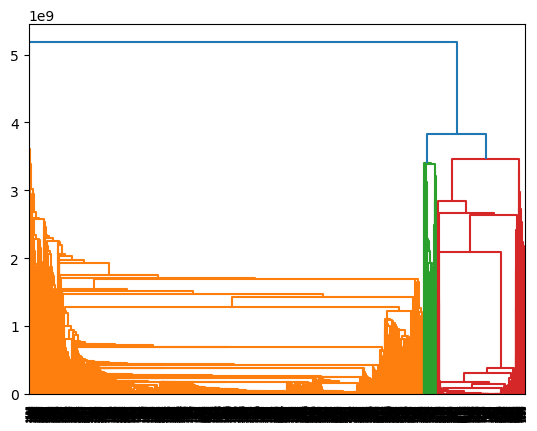

In [66]:
#creating dendogram 
import scipy.cluster.hierarchy as sch
sch.dendrogram(sch.linkage(DATA_X1,method='single'))
plt.show()



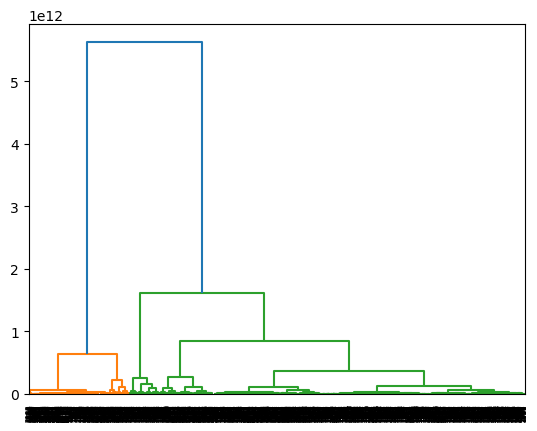

In [67]:
#creating dendogram 
import scipy.cluster.hierarchy as sch
sch.dendrogram(sch.linkage(DATA_X1,method='ward'))
plt.show()



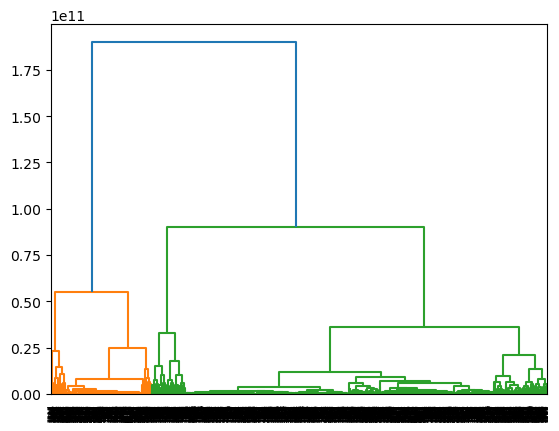

In [68]:
#creating dendogram 
import scipy.cluster.hierarchy as sch
sch.dendrogram(sch.linkage(DATA_X1,method='average'))
plt.show()



In [69]:
#creating cluster with agglomerative

from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')


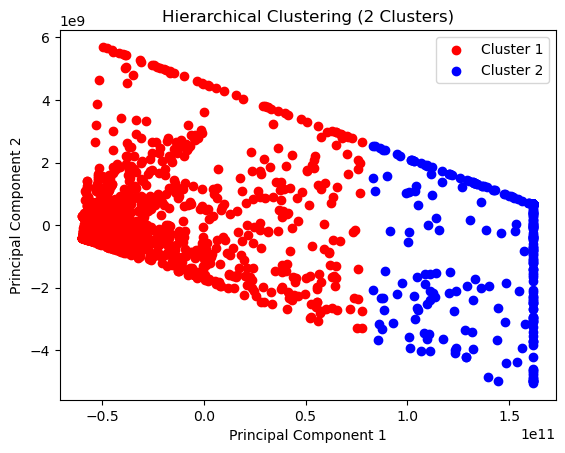

In [70]:
agg_clustering = AgglomerativeClustering(n_clusters=2)  # Adjust the number of clusters as needed
agg1 = agg_clustering.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[agg1 == 0, 0], Data_MinMax[agg1 == 0, 1], c='red', label='Cluster 1')
plt.scatter(Data_MinMax[agg1== 1, 0], Data_MinMax[agg1 == 1, 1], c='blue', label='Cluster 2')
plt.title('Hierarchical Clustering (2 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [71]:
from sklearn.metrics import silhouette_score
silhouette_score(DATA_X1, agg1)

0.8425328081040393

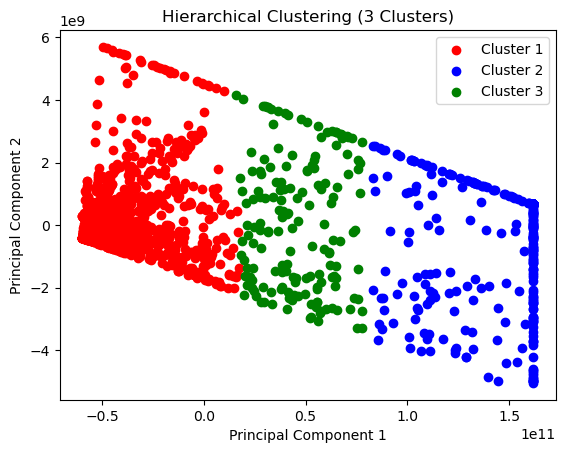

In [72]:
# Clusters with 3 
agg_clustering = AgglomerativeClustering(n_clusters=3)  # Adjust the number of clusters as needed
agg2 = agg_clustering.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[agg2 == 0, 0], Data_MinMax[agg2 == 0, 1], c='red', label='Cluster 1')
plt.scatter(Data_MinMax[agg2== 1, 0], Data_MinMax[agg2 == 1, 1], c='blue', label='Cluster 2')
plt.scatter(Data_MinMax[agg2== 2, 0], Data_MinMax[agg2 == 2, 1], c='green', label='Cluster 3')

plt.title('Hierarchical Clustering (3 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [73]:
from sklearn.metrics import silhouette_score
silhouette_score(DATA_X1, agg2)

0.7898187249899438

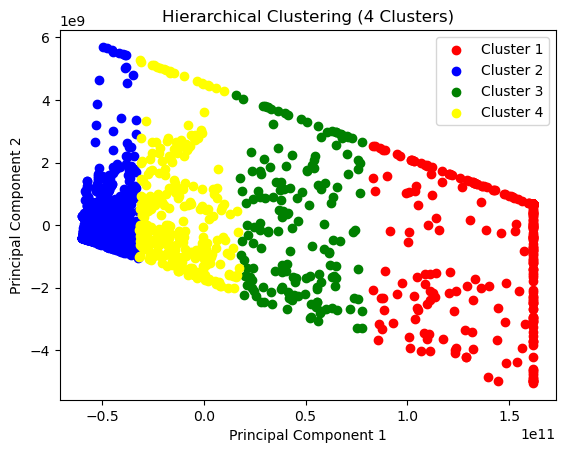

In [74]:
# with cluster 4

# Clusters with 3 
agg_clustering = AgglomerativeClustering(n_clusters=4)  # Adjust the number of clusters as needed
agg3 = agg_clustering.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[agg3 == 0, 0], Data_MinMax[agg3 == 0, 1], c='red', label='Cluster 1')
plt.scatter(Data_MinMax[agg3== 1, 0], Data_MinMax[agg3 == 1, 1], c='blue', label='Cluster 2')
plt.scatter(Data_MinMax[agg3== 2, 0], Data_MinMax[agg3 == 2, 1], c='green', label='Cluster 3')
plt.scatter(Data_MinMax[agg3== 3, 0], Data_MinMax[agg3 == 3, 1], c='yellow', label='Cluster 4')

plt.title('Hierarchical Clustering (4 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [75]:
from sklearn.metrics import silhouette_score
silhouette_score(DATA_X1, agg3)

0.7334708678644163

# Model Building With Kmeans

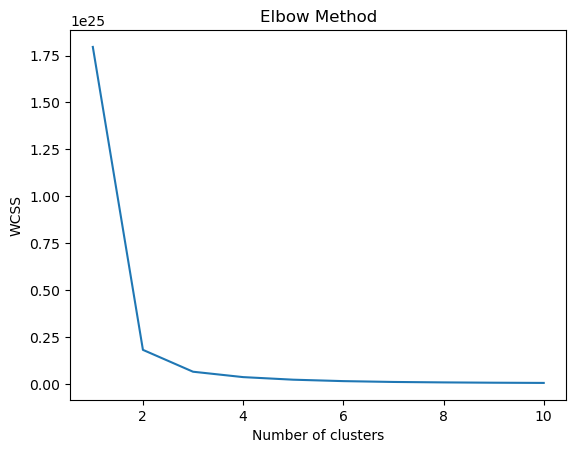

In [76]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,random_state=42)
    kmeans.fit(DATA_X1)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

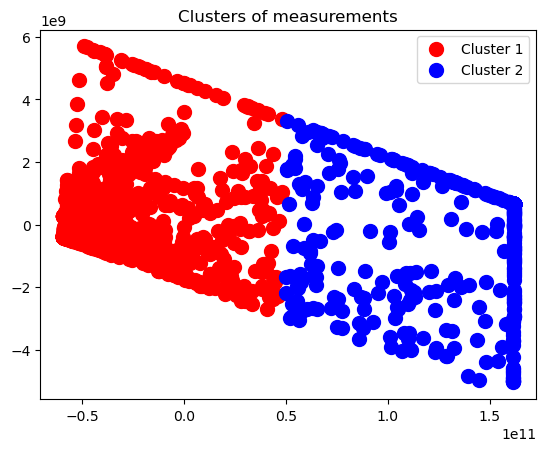

In [77]:
#tring with cluster value as 2
Kmeans11=KMeans(n_clusters=2,init='k-means++',random_state=42)
df1_predicted=Kmeans11.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[df1_predicted == 0, 0], Data_MinMax[df1_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(Data_MinMax[df1_predicted == 1, 0], Data_MinMax[df1_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [78]:
ss1 = silhouette_score(DATA_X1, df1_predicted)
print('Silhouette Score for K-means clustring :',ss1)

Silhouette Score for K-means clustring : 0.8490012192020776


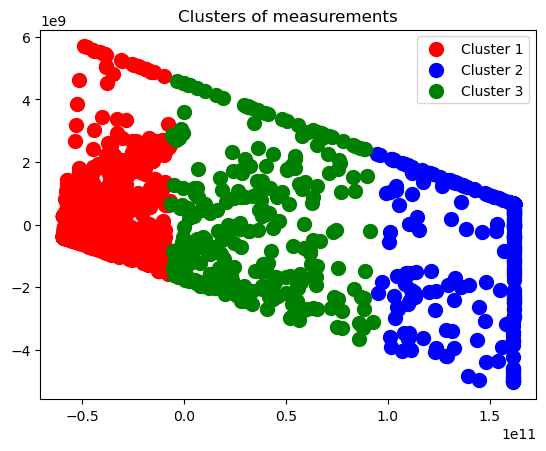

In [79]:
#tring with cluster value as 3
#tring with cluster value as 2
Kmeans11=KMeans(n_clusters=3,init='k-means++',random_state=42)
df2_predicted=Kmeans11.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[df2_predicted == 0, 0], Data_MinMax[df2_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(Data_MinMax[df2_predicted == 1, 0], Data_MinMax[df2_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(Data_MinMax[df2_predicted == 2, 0], Data_MinMax[df2_predicted == 2, 1], s = 100, c = 'green', label = 'Cluster 3')

plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [80]:
ss2 = silhouette_score(DATA_X1, df2_predicted) 
print('Silhouette Score for K-means clustring :',ss2)

Silhouette Score for K-means clustring : 0.805373108118339


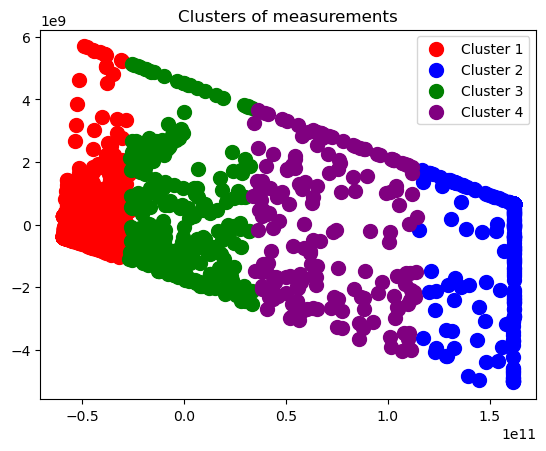

In [81]:
#with 4 clusters
Kmeans11 = KMeans(n_clusters=4, init='k-means++', random_state=42)
df2_predicted4 = Kmeans11.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[df2_predicted4 == 0, 0], Data_MinMax[df2_predicted4 == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(Data_MinMax[df2_predicted4 == 1, 0], Data_MinMax[df2_predicted4 == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(Data_MinMax[df2_predicted4 == 2, 0], Data_MinMax[df2_predicted4 == 2, 1], s=100, c='green', label='Cluster 3')
plt.scatter(Data_MinMax[df2_predicted4 == 3, 0], Data_MinMax[df2_predicted4 == 3, 1], s=100, c='purple', label='Cluster 4')

plt.title('Clusters of measurements')
plt.legend()
plt.show()


In [82]:
ss2 = silhouette_score(DATA_X1, df2_predicted4)
print('Silhouette Score for K-means clustring :',ss2)

Silhouette Score for K-means clustring : 0.7588844224552629


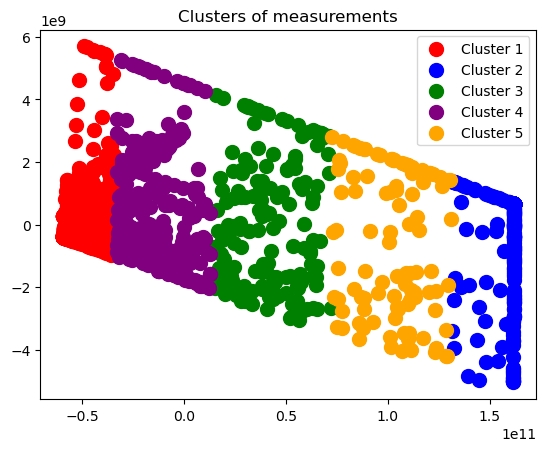

In [83]:
#with 5 clusters
Kmeans11 = KMeans(n_clusters=5, init='k-means++', random_state=42)
df2_predicted5 = Kmeans11.fit_predict(DATA_X1)

plt.scatter(Data_MinMax[df2_predicted5 == 0, 0], Data_MinMax[df2_predicted5 == 0, 1], s=100, c='red', label='Cluster 1')
plt.scatter(Data_MinMax[df2_predicted5 == 1, 0], Data_MinMax[df2_predicted5 == 1, 1], s=100, c='blue', label='Cluster 2')
plt.scatter(Data_MinMax[df2_predicted5 == 2, 0], Data_MinMax[df2_predicted5 == 2, 1], s=100, c='green', label='Cluster 3')
plt.scatter(Data_MinMax[df2_predicted5 == 3, 0], Data_MinMax[df2_predicted5 == 3, 1], s=100, c='purple', label='Cluster 4')
plt.scatter(Data_MinMax[df2_predicted5 == 4, 0], Data_MinMax[df2_predicted5 == 4, 1], s=100, c='orange', label='Cluster 5')

plt.title('Clusters of measurements')
plt.legend()
plt.show()


In [84]:
ss2 = silhouette_score(DATA_X1, df2_predicted5)
print('Silhouette Score for K-means clustring :',ss2)

Silhouette Score for K-means clustring : 0.7383700104122665


# Model Building of DBSCAN

In [85]:
from sklearn.cluster import DBSCAN
db1 = DBSCAN() # default eps=0.5, min_samples=5
dbb1=db1.fit_predict(DATA_X1)

silhouette_score(DATA_X1,dbb1)

0.49969457353115415

In [86]:
db2 = DBSCAN(eps=1,min_samples=2)
dbb2=db2.fit_predict(DATA_X1)
silhouette_score(DATA_X1,dbb2)

-0.6272599785636312

In [87]:
db3 = DBSCAN(eps=1,min_samples=3)
dbb3=db3.fit_predict(DATA_X1)
silhouette_score(DATA_X1,dbb3)

-0.6345527537745309

In [88]:
db4 = DBSCAN(eps=1,min_samples=4)
dbb4=db4.fit_predict(DATA_X1)
silhouette_score(DATA_X1,dbb4)

-0.6371982105944928

In [91]:
print("KMeans with 2 clusters:", silhouette_score(DATA_X1, df1_predicted))
print("KMeans with 3 clusters:", silhouette_score(DATA_X1, df2_predicted))
print("KMeans with 4 clusters:", silhouette_score(DATA_X1, df2_predicted4))
print("KMeans with 5 clusters:", silhouette_score(DATA_X1, df2_predicted5))

print("Hierarchical clustering with 2 clusters:", silhouette_score(DATA_X1,agg1))
print("Hierarchical clustering with 3 clusters:", silhouette_score(DATA_X1,agg2))
print("Hierarchical clustering with 4 clusters:", silhouette_score(DATA_X1,agg3))
print("DBSCAN with default epsilon(0.5):",silhouette_score(DATA_X1,dbb1))
print("DBSCAN with 2 min samples:",silhouette_score(DATA_X1,dbb2))
print("DBSCAN with 3 min samples:",silhouette_score(DATA_X1,dbb3))
print("DBSCAN with 4 min samples:",silhouette_score(DATA_X1,dbb4))


KMeans with 2 clusters: 0.8490012192020776
KMeans with 3 clusters: 0.805373108118339
KMeans with 4 clusters: 0.7588844224552629
KMeans with 5 clusters: 0.7383700104122665
Hierarchical clustering with 2 clusters: 0.8425328081040393
Hierarchical clustering with 3 clusters: 0.7898187249899438
Hierarchical clustering with 4 clusters: 0.7334708678644163
DBSCAN with default epsilon(0.5): 0.49969457353115415
DBSCAN with 2 min samples: -0.6272599785636312
DBSCAN with 3 min samples: -0.6345527537745309
DBSCAN with 4 min samples: -0.6371982105944928
